In [1]:
#To run cross-validation on the way I am currently fitting head direction fields #

In [1]:
### Import Packages ###
import glob, os, sys
import numpy as np
import matplotlib.pyplot as plt


In [2]:
### Importing Neuronal Spiking Data ###

#Working directory for where the data is stored
cwd = "/Users/anthony/Google_Drive/McGill/Third_year_U3/2018_Winter_UCL/NEURM012/project/dataset_th-1/Mouse12-120806"

#Import the spike time for electrodes 1-9 and sort (ignoring double digit electrodes for now)
spkFile_paths = [file for file in glob.glob(os.path.join(cwd, "Mouse12-120806.res.[0-8]"))]
spkFile_paths.sort()

#Import the cluster identities for electrodes 1-9 and sort
clusFile_paths = [file for file in glob.glob(os.path.join(cwd, "Mouse12-120806.clu.[0-8]"))]
clusFile_paths.sort()

#Lists to store the numpy data
spk_data = []
clus_data = []
#Iterate over paths to import raw data
print("Importing data from files:")
for file_idx in range(0,len(clusFile_paths)): #TODO: limiting it to 2 files for now for simplicity
    print(spkFile_paths[file_idx])
    spk_data.append( np.loadtxt(spkFile_paths[file_idx]) )
    print(clusFile_paths[file_idx])
    clus_data.append( np.loadtxt(clusFile_paths[file_idx],skiprows=1) )


Importing data from files:
/Users/anthony/Google_Drive/McGill/Third_year_U3/2018_Winter_UCL/NEURM012/project/dataset_th-1/Mouse12-120806/Mouse12-120806.res.1
/Users/anthony/Google_Drive/McGill/Third_year_U3/2018_Winter_UCL/NEURM012/project/dataset_th-1/Mouse12-120806/Mouse12-120806.clu.1
/Users/anthony/Google_Drive/McGill/Third_year_U3/2018_Winter_UCL/NEURM012/project/dataset_th-1/Mouse12-120806/Mouse12-120806.res.2
/Users/anthony/Google_Drive/McGill/Third_year_U3/2018_Winter_UCL/NEURM012/project/dataset_th-1/Mouse12-120806/Mouse12-120806.clu.2
/Users/anthony/Google_Drive/McGill/Third_year_U3/2018_Winter_UCL/NEURM012/project/dataset_th-1/Mouse12-120806/Mouse12-120806.res.3
/Users/anthony/Google_Drive/McGill/Third_year_U3/2018_Winter_UCL/NEURM012/project/dataset_th-1/Mouse12-120806/Mouse12-120806.clu.3
/Users/anthony/Google_Drive/McGill/Third_year_U3/2018_Winter_UCL/NEURM012/project/dataset_th-1/Mouse12-120806/Mouse12-120806.res.4
/Users/anthony/Google_Drive/McGill/Third_year_U3/2018_Wi

Importing head direction data...
(874005,)
Range: -1.000000 - 6.283200


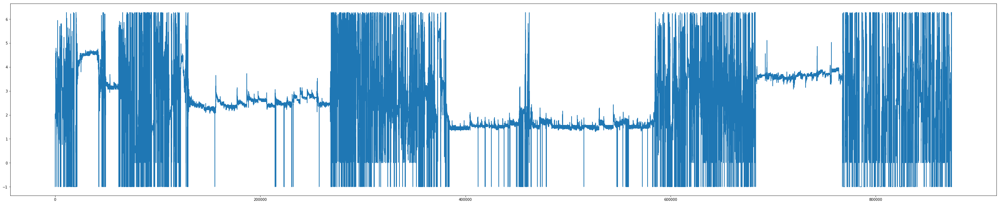

In [3]:
### Import the head direction data ###
print("Importing head direction data...")
hd_data = np.loadtxt("/Users/anthony/Google_Drive/McGill/Third_year_U3/2018_Winter_UCL/NEURM012/project/dataset_th-1/AngFiles/Mouse12-120806.ang")

##Note
# The head direction angle is sampled at 39.06Hz whereas the recording is done at 20,000 Hz
# Thus for every approx. 512 electrophys datapoint there is 1 angle / position datapoint 

print (np.shape(hd_data))
print ("Range: %f - %f" % (np.min(hd_data), np.max(hd_data)))

#Visualize
plt.figure(figsize=(50,10))
plt.plot(hd_data)
plt.show()

In [4]:
### Isolate each spike time from each file to store in 2D List ###

raw_clus_spkTimes = []

#Iterate through each dataset file to extract clusters
for fileIdx in range(0,len(spk_data)):
    #Iterate through each cluster
    for inFile_clusIdx in range(2, int(max(clus_data[fileIdx])+1)):
        #Extract this particular cluster
        isClus_binArr = ( clus_data[fileIdx] == inFile_clusIdx )
        curClus_spks = np.extract(isClus_binArr, spk_data[fileIdx])
        
        #Check that there are acutally some spikes here:
        if len(curClus_spks) > 0:
            #User indication
            print("Number of spike events for file index %d, cluster %d: %d" % (fileIdx, inFile_clusIdx, len(curClus_spks)))
            #Add to 2d array
            raw_clus_spkTimes.append(curClus_spks)
        else:
            #User indication
            print("Number of spike events for file index %d, cluster %d: %d (excluded)" % (fileIdx, inFile_clusIdx, len(curClus_spks)))

    #Line to separate between files
    print()

Number of spike events for file index 0, cluster 2: 10089
Number of spike events for file index 0, cluster 3: 381824
Number of spike events for file index 0, cluster 4: 32179
Number of spike events for file index 0, cluster 5: 9271
Number of spike events for file index 0, cluster 6: 150139
Number of spike events for file index 0, cluster 7: 957160
Number of spike events for file index 0, cluster 8: 26716

Number of spike events for file index 1, cluster 2: 11188
Number of spike events for file index 1, cluster 3: 6805
Number of spike events for file index 1, cluster 4: 190107
Number of spike events for file index 1, cluster 5: 69683
Number of spike events for file index 1, cluster 6: 230040
Number of spike events for file index 1, cluster 7: 312274
Number of spike events for file index 1, cluster 8: 342310
Number of spike events for file index 1, cluster 9: 214466

Number of spike events for file index 2, cluster 2: 12093
Number of spike events for file index 2, cluster 3: 9966
Number 

In [5]:
### Extract the nearest head direction for each spiking event ###

# Ratio between freq_spiking_recording / freq_headAngle_recording sampling frequencies 
r_spk_ang = 20000.0 / 39.06

#Extract the head direction associated with each spiking event
raw_spk_HDs = []
for spkTime_arr in raw_clus_spkTimes:
    #Calculate the frame of the HD recording for each spike, rounding to nearest integer
    hd_frame_float_arr = spkTime_arr / r_spk_ang
    hd_frame_arr = np.rint(hd_frame_float_arr).astype(int)
    
    #Take the head direction at each (converted) spike time
    #If the index == N_ang, take the N_ang-1-th index since HD should not change that much (thus mode='clip')
    cur_spkHD = np.take(hd_data, hd_frame_arr, mode='clip')
    
    raw_spk_HDs.append(cur_spkHD)
    

In [6]:
### Function to get a (QCed) spike event histogram given raw HD indeces ###
# Returns: the number of spiking events per HD frame
def get_spk_histogram(HD_startIdx, HD_endIdx, clusIdx):
    #In case the index are errorenous
    if HD_endIdx <= HD_startIdx:
        return np.empty(0)
    
    #Get the time ranges in the electrophys recording that correspond to the start and end ranges in HD recording
    electrophys_startTime = HD_startIdx * r_spk_ang
    electrophys_endTime = HD_endIdx * r_spk_ang
    
    #Extract the spiking events from this particular cluster
    inRange_spks_binArr = (raw_clus_spkTimes[clusIdx] >= electrophys_startTime) & (raw_clus_spkTimes[clusIdx] < electrophys_endTime)
    spkTimes = np.extract( inRange_spks_binArr , raw_clus_spkTimes[clusIdx] )
    
    #Generate a raw histogram
    raw_spk_hist = np.histogram(spkTimes,bins=(HD_endIdx-HD_startIdx),range=(electrophys_startTime,electrophys_endTime))[0]
    
    #Quality control the histogram via excluding the timepoints with no HD recording
    HD_subArr = hd_data[HD_startIdx:HD_endIdx]
    good_HDrec_binArr = (HD_subArr>= 0.0)
    QCed_spk_hist = np.extract(good_HDrec_binArr, raw_spk_hist)
    
    return QCed_spk_hist

### Function to get a (QCed) polar spiking histogram given raw HD indeces ###
# Returns: the number of spiking events in this HD range per angular range
# Each bin is 2*pi / N_bins radians wide
# This turned out to be a useless funciton
def get_polar_spk_histogram(HD_startIdx, HD_endIdx, clusIdx, N_bins):
    #Exception check?
    if HD_endIdx <= HD_startIdx:
        raise IndexError("Starting index is larger than the end index.")
    
    #Get the time ranges in the electrophys recording that correspond to the start and end ranges in HD recording
    electrophys_startTime = HD_startIdx * r_spk_ang
    electrophys_endTime = HD_endIdx * r_spk_ang
    
    #Extract the spiking events from this particular cluster
    inRange_spks_binArr = (raw_clus_spkTimes[clusIdx] >= electrophys_startTime) & (raw_clus_spkTimes[clusIdx] < electrophys_endTime)
    spk_HDs = np.extract( inRange_spks_binArr , raw_spk_HDs[clusIdx] )
    
    #Quality control the angles
    QC_spkAng_binArr = (spkAngs >= 0.0)
    QCed_spk_HDs = np.extract(QC_spkAng_binArr, spk_HDs)
    
    #Compute histogram
    spk_HD_hist_struct = np.histogram(QCed_spk_HDs, bins=N_bins, range=(0,2*np.pi))
    
    return spk_HD_hist_struct[0]
    


### Function to get a (QCed) head direction array given raw HD indeces ###
def get_HD_rads(HD_startIdx, HD_endIdx):
    #In case the index are errorenous
    if HD_endIdx <= HD_startIdx:
        return np.empty(0)
    
    #Get the raw sub-array 
    HD_subArr = hd_data[HD_startIdx:HD_endIdx]
    #Quality control 
    good_HDrec_binArr = (HD_subArr>= 0)
    QCed_HD_subArr = np.extract(good_HDrec_binArr, HD_subArr)
    
    return QCed_HD_subArr


### Function to compute the L value ###
# predicted_HDfield: the predicted head direction firing rate along a 360 axis
# cv_HD_degs: array of (QCed) head direction (in rads) for the cross-validation set
# cv_spkHist: array of (QCed) spike time histogram for the cross-validation set
# *len(cv_HD_degs) == len(cv_spkHist)
def compute_L_val(predicted_HD_field, cv_HD_rads, cv_spkHist):
    #Convert the head directions to integer angles
    cv_HD_degs = np.mod( np.rint( np.degrees(cv_HD_rads) ).astype(int) , 360 )
    
    #Get the predicted firing rate using the head direction field (unit: events per 1/39.06 s)
    cvPredicted_firingRate = np.take(predicted_HD_field, cv_HD_degs)
    
    #Compute the correct term via weighted sum of # of spikes and log predicted firing rate
    log_cvPredicted_firingRate = np.log(cvPredicted_firingRate)
    correctTerm = np.dot(cv_spkHist , log_cvPredicted_firingRate)
    
    #Compute the incorrec term via the entire area under the predicted firing curve
    incorrectTerm = sum(cvPredicted_firingRate)
    
    #Compute the L term and print
    L_val = correctTerm - incorrectTerm
    return L_val

## Compute the perfect L value (upper bound) ##
def compute_perfect_L_val(cv_spkHist):
    #Set the predicted firing rate to be the actual number of spikes per HD frame, fixed for zeros
    cvPredicted_firingRate = cv_spkHist + np.finfo(float).eps
    
    #Compute the correct term via weighted sum of # of spikes and log predicted firing rate
    log_cvPredicted_firingRate = np.log(cvPredicted_firingRate)
    correctTerm = np.dot(cv_spkHist , log_cvPredicted_firingRate)
    
    #Compute the incorrec term via the entire area under the predicted firing curve
    incorrectTerm = sum(cvPredicted_firingRate)
    
    #Compute the L term and print
    L_val = correctTerm - incorrectTerm
    return L_val


### Function to compute the Q value ###
# predicted_HDfield: the predicted head direction firing rate along a 360 axis
# cv_HD_degs: array of (QCed) head direction (in rads) for the cross-validation set
# cv_spkHist: array of (QCed) spike time histogram for the cross-validation set
# *len(cv_HD_degs) == len(cv_spkHist)
def compute_Q_val(predicted_HD_field, cv_HD_rads, cv_spkHist):
    #Convert the head directions to integer angles
    cv_HD_degs = np.mod( np.rint( np.degrees(cv_HD_rads) ).astype(int) , 360 )
    
    #Get the predicted firing rate using the head direction field (unit: events per 1/39.06 s)
    cvPredicted_firingRate = np.take(predicted_HD_field, cv_HD_degs)
    
    #Compute the correct term via weighted sum of # of spikes and predicted firing rate
    correctTerm = np.dot( cv_spkHist , cvPredicted_firingRate )
    
    #Compute the incorrec term via the entire squared area under the predicted firing curve
    incorrectTerm = np.dot( cvPredicted_firingRate , cvPredicted_firingRate)
    
    #Compute the finalized Q term and return
    Q_val = correctTerm - ( incorrectTerm / 2.0 )
    return Q_val

## Compute the perfect Q value ##
def compute_perfect_Q_val(cv_spkHist):
    #Set the predicted firing rate to be the actual number of spikes per HD frame
    cvPredicted_firingRate = cv_spkHist
    
    #Compute the correct term via weighted sum of # of spikes and predicted firing rate
    correctTerm = np.dot( cv_spkHist , cvPredicted_firingRate )
    
    #Compute the incorrec term via the entire squared area under the predicted firing curve
    incorrectTerm = np.dot( cvPredicted_firingRate , cvPredicted_firingRate)
    
    #Compute the finalized Q term and return
    Q_val = correctTerm - ( incorrectTerm / 2.0 )
    return Q_val
    

Cluster 0 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


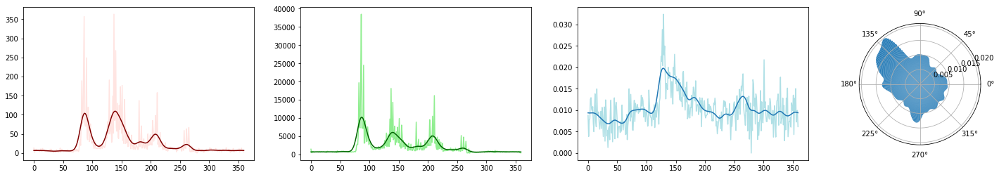

Cluster 1 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


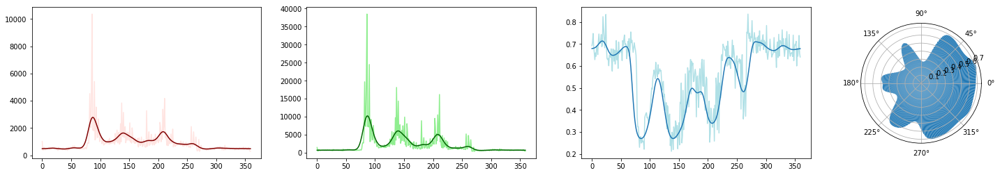

Cluster 2 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


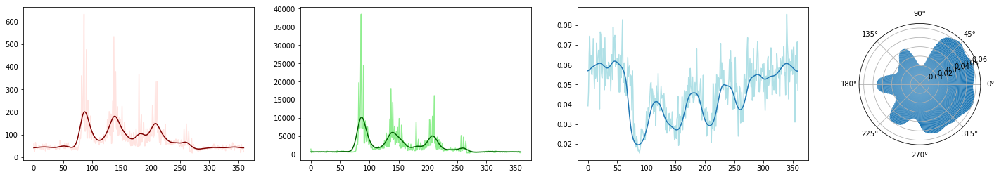

Cluster 3 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


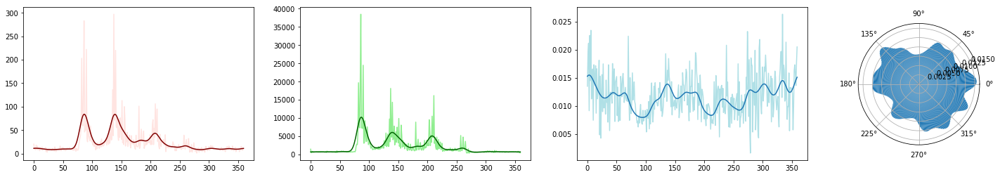

Cluster 4 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


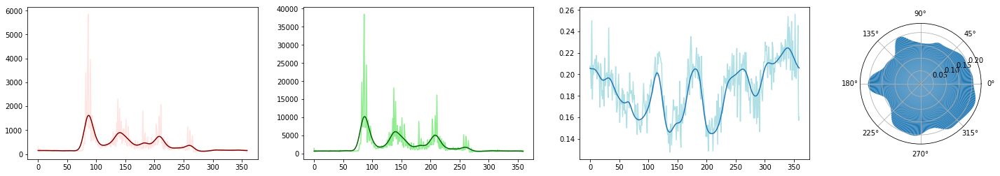

Cluster 5 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


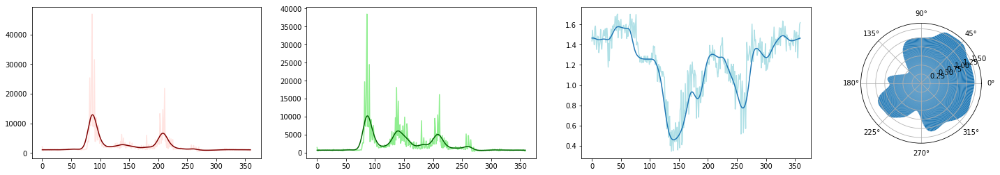

Cluster 6 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


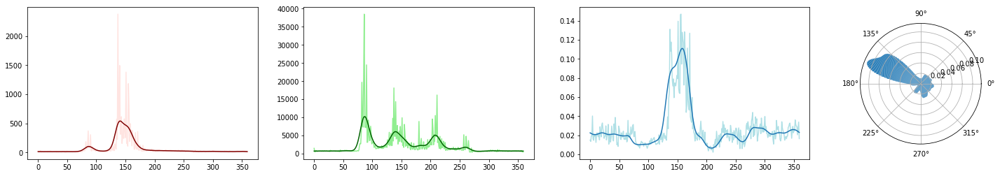

Cluster 7 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


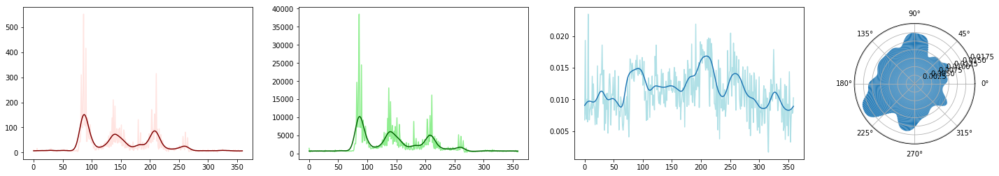

Cluster 8 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


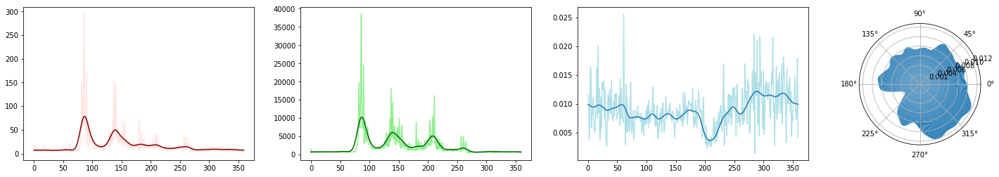

Cluster 9 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


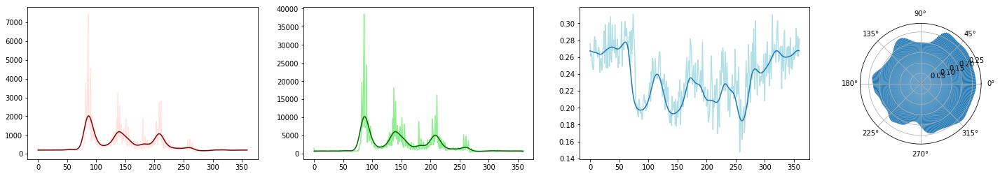

Cluster 10 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


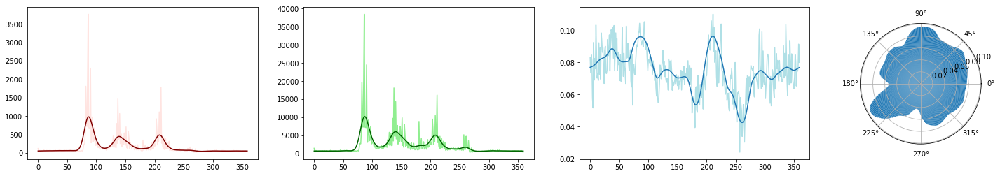

Cluster 11 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


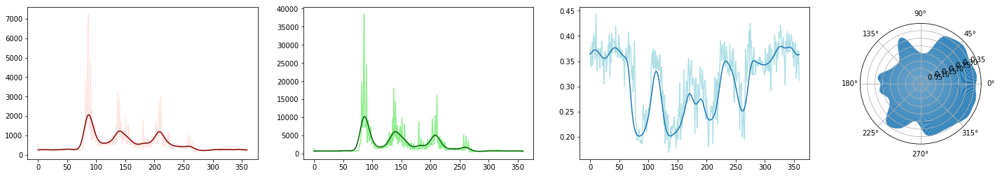

Cluster 12 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


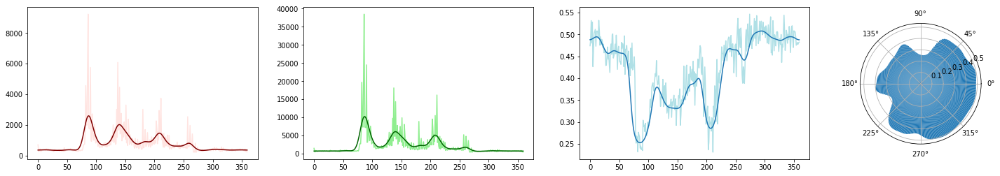

Cluster 13 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


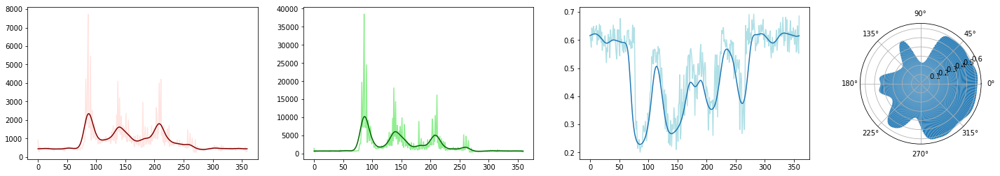

Cluster 14 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


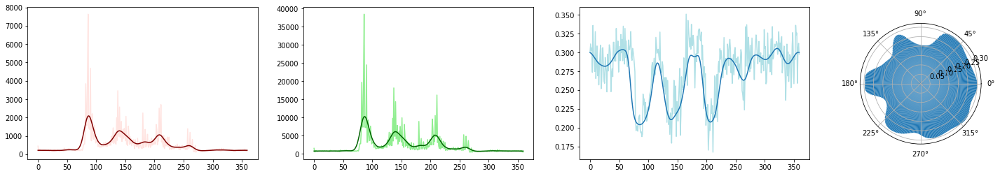

Cluster 15 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


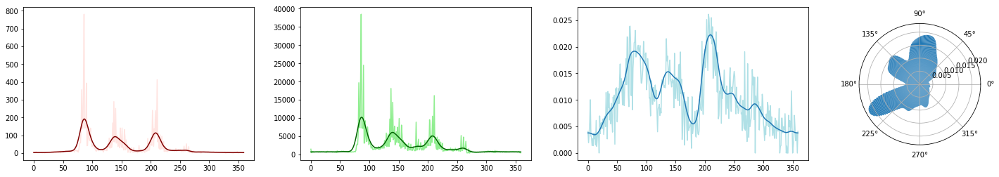

Cluster 16 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


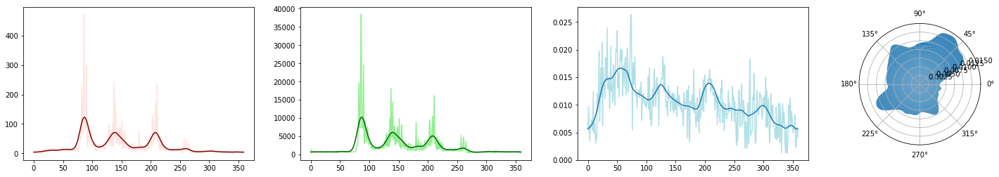

Cluster 17 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


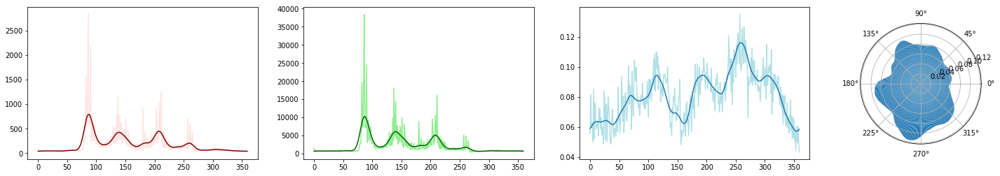

Cluster 18 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


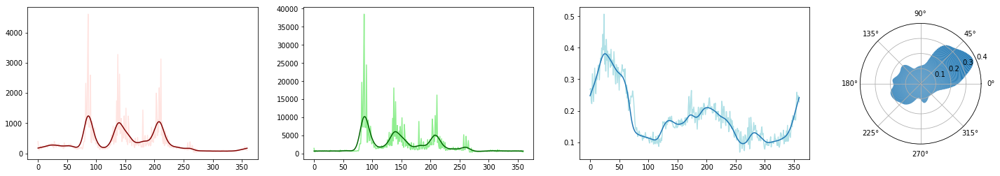

Cluster 19 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


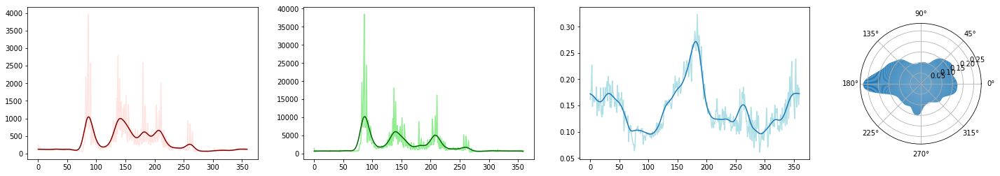

Cluster 20 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


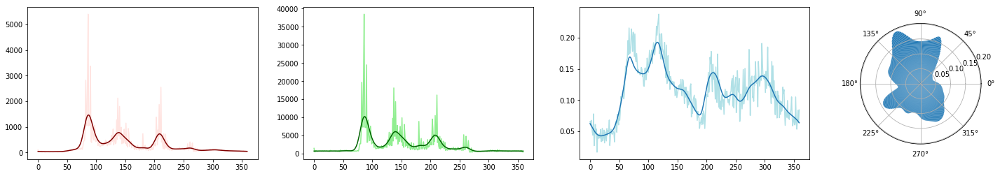

Cluster 21 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


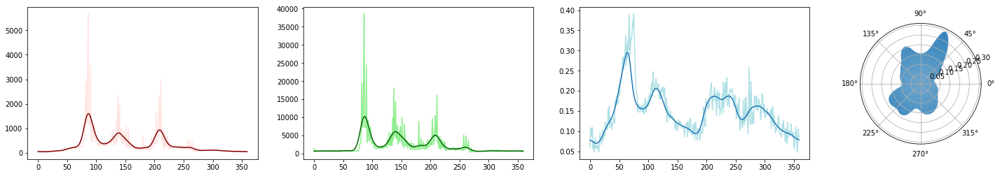

Cluster 22 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


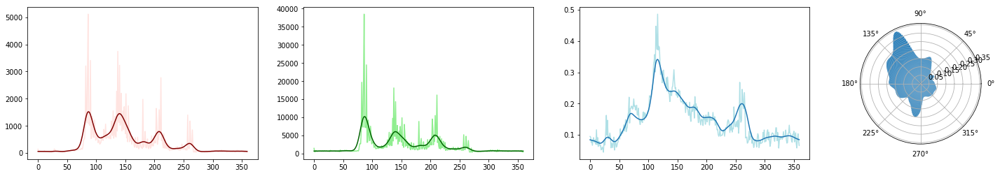

Cluster 23 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


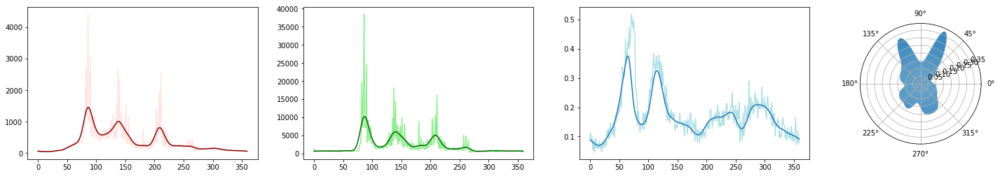

Cluster 24 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


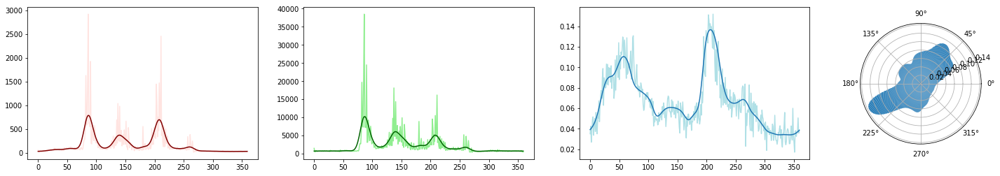

Cluster 25 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


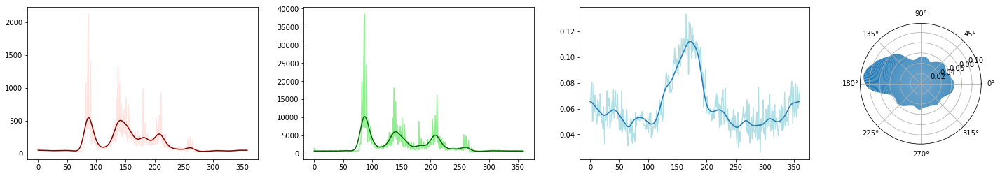

Cluster 26 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


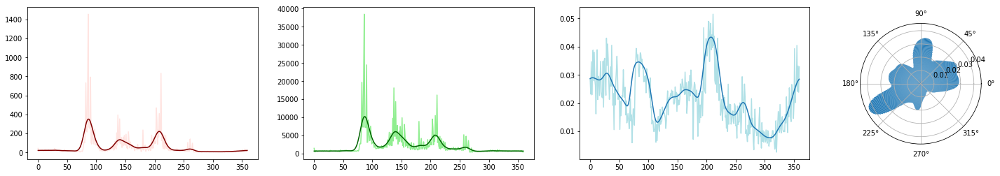

Cluster 27 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


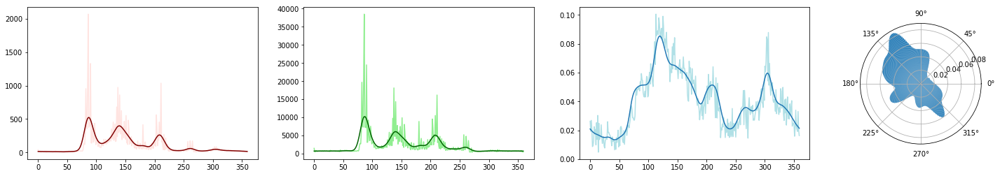

Cluster 28 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


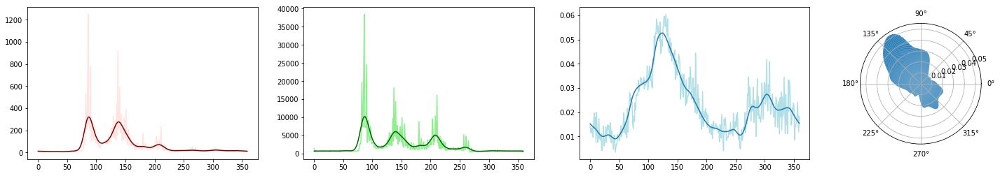

Cluster 29 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


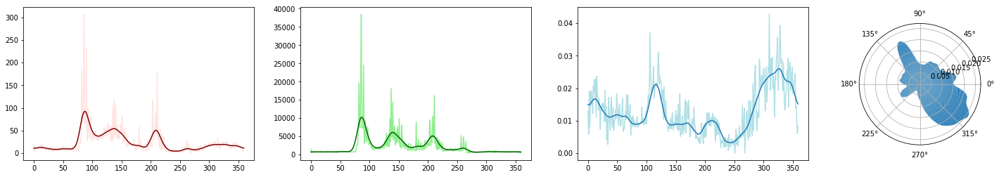

Cluster 30 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


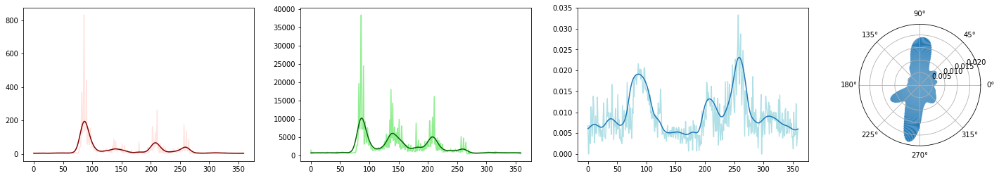

Cluster 31 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


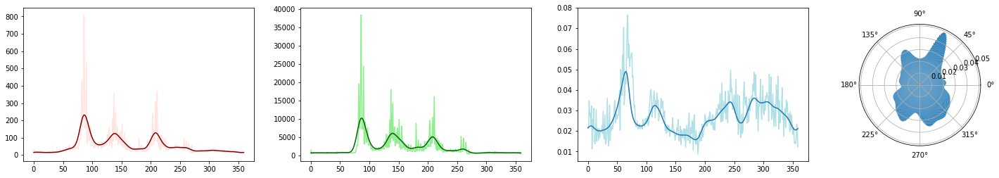

Cluster 32 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


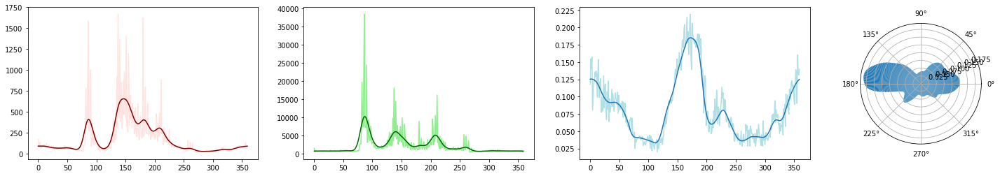

Cluster 33 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


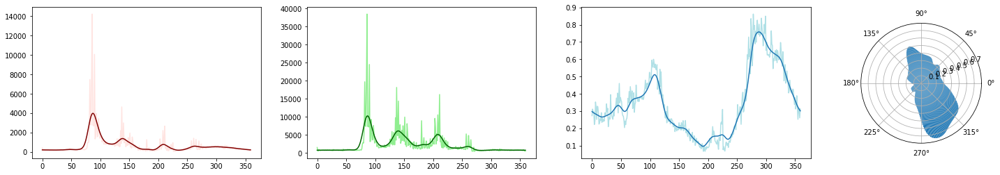

Cluster 34 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


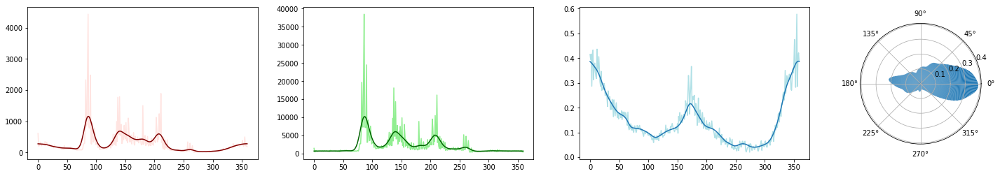

Cluster 35 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


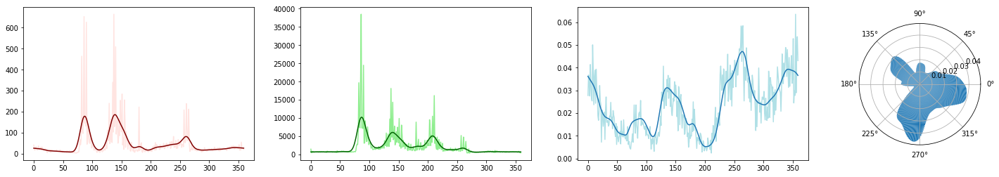

Cluster 36 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


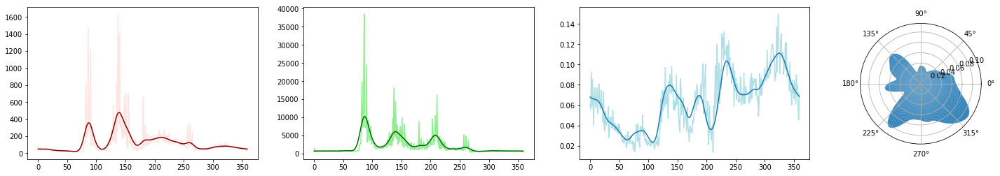

Cluster 37 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


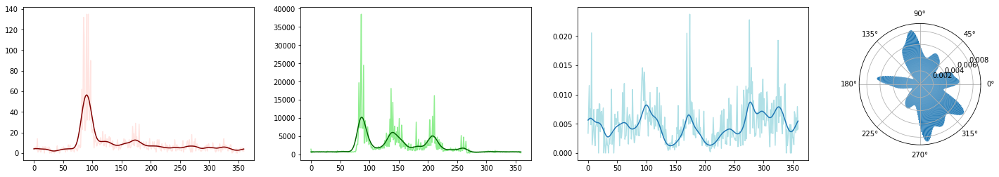

Cluster 38 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


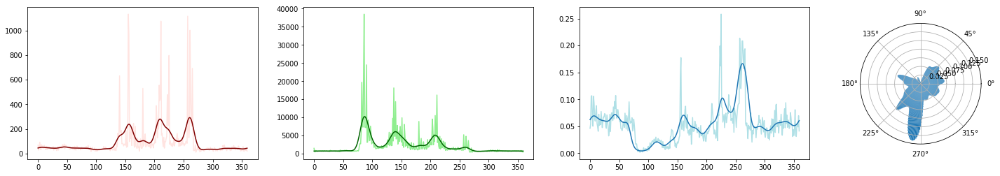

Cluster 39 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


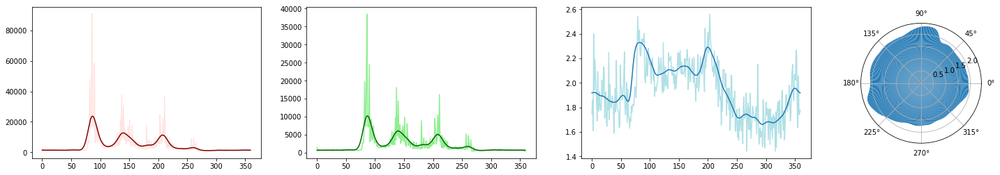

Cluster 40 	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


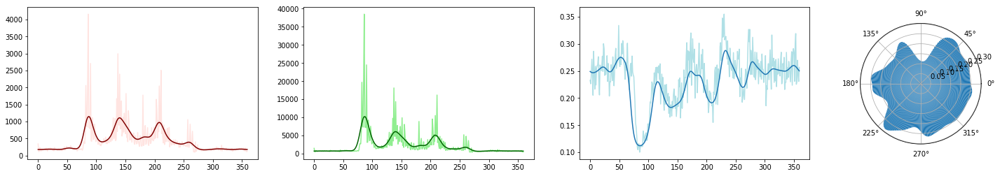

In [7]:
### Visualize head direction field for all cell clusters using all (most) data ###

#Set indeces (In this case, 0-874004 are the HD indeces)
set_HD_startIdx = 0
set_HD_endIdx = 870000


from scipy import ndimage

#Iterate through all cell clusters
for clus_idx in range(0,len(raw_clus_spkTimes)):
    #Acquire the spike event histogram per head direction frame
    all_spkHist = get_spk_histogram(set_HD_startIdx, set_HD_endIdx, clus_idx)
    #Acquire the head direction radian per frame
    all_hd_rads = get_HD_rads(set_HD_startIdx, set_HD_endIdx)
    
    #Get the spike to radian histogram and smooth
    spkHD_hist = np.histogram(all_hd_rads, bins=360, range=(0,2*np.pi), weights=all_spkHist)[0].astype(float)
    spkHD_hist_smoothed = ndimage.filters.gaussian_filter(spkHD_hist,6,mode='wrap')
    
    #Get the radian occupancy histogram and smooth
    timeHD_hist = np.histogram(all_hd_rads, bins=360, range=(0,2*np.pi))[0].astype(float)
    timeHD_hist_smoothed = ndimage.filters.gaussian_filter(timeHD_hist,6,mode='wrap')
    
    #Compute the head direction (averaged firing rate) field
    HD_field_preSmoothed = np.divide(spkHD_hist_smoothed, timeHD_hist_smoothed)
    HD_field_rawUnsmoothed = np.divide(spkHD_hist, timeHD_hist+np.finfo(float).eps) #Purely for visualization purpose
    
    #Compute a uniform firing rate for a uniform head-direction field
    #HD_field_uniform = [ float(sum(training_spkHist)) / float(len(training_spkHist)) ] * 360
    
    #Visualize 
    print("Cluster %d \tSpike histogram, Time histogram, Pre-smoothed Field, Polar Field"%clus_idx)
    #Set up figure
    fig, ax = plt.subplots(1,3)
    fig.set_figwidth(20)
    #Plot the spiking histogram
    ax[0].plot(spkHD_hist,color='mistyrose')
    ax[0].plot(spkHD_hist_smoothed, color='maroon')
    #Plot the total time spent histogram
    ax[1].plot(timeHD_hist,color='lightgreen')
    ax[1].plot(timeHD_hist_smoothed,color='darkgreen')
    #Plot the pre-smoothed
    ax[2].plot(HD_field_rawUnsmoothed,color='powderblue')
    ax[2].plot(HD_field_preSmoothed,color='#1f77b4')
    #polar plot
    polar_ax = fig.add_axes([0.71, 0.2, 0.6, 0.6], polar=True)
    polar_ax.bar(np.linspace(0.0,2*np.pi,360,endpoint=False), HD_field_preSmoothed, width=(2.0*np.pi/360))
    plt.show()   
    

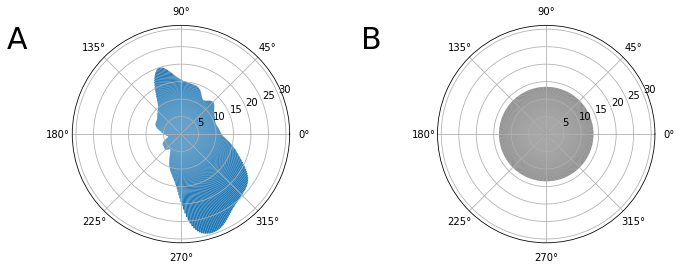

In [8]:
#Visualize the computed field against a null uniform field

clus_idx = 33

#Acquire the spike event histogram per head direction frame
all_spkHist = get_spk_histogram(0, 870000, clus_idx)
#Acquire the head direction radian per frame
all_hd_rads = get_HD_rads(0, 870000)

#Get the spike to radian histogram and smooth
spkHD_hist = np.histogram(all_hd_rads, bins=360, range=(0,2*np.pi), weights=all_spkHist)[0].astype(float)
spkHD_hist_smoothed = ndimage.filters.gaussian_filter(spkHD_hist,6,mode='wrap')

#Get the radian occupancy histogram and smooth
timeHD_hist = np.histogram(all_hd_rads, bins=360, range=(0,2*np.pi))[0].astype(float) / 39.06
timeHD_hist_smoothed = ndimage.filters.gaussian_filter(timeHD_hist,6,mode='wrap')

#Compute the head direction (averaged firing rate) field
HD_field_preSmoothed = np.divide(spkHD_hist_smoothed, timeHD_hist_smoothed)

#The two fields to plot
radii_l = HD_field_preSmoothed
radii_r = [np.average(HD_field_preSmoothed)] * 360

#Set up graph 
fig, axarr = plt.subplots(1,2, subplot_kw=dict(projection='polar'))
fig.set_figwidth(12)

theta = np.linspace(0.0,2*np.pi,360,endpoint=False)
width = (2*np.pi) / 360

#plot and show
axarr[0].bar(theta, radii_l, width=width, bottom=0) #pre-smooth
axarr[0].text(0.1, 0.8, "A", fontsize=30, transform=plt.gcf().transFigure)
axarr[1].bar(theta, radii_l, width=width, bottom=0, color='white') #plt this one to be invisible to align the axis
axarr[1].bar(theta, radii_r, width=width, bottom=0, color='gray') #post-smooth
axarr[1].text(0.51, 0.8, "B", fontsize=30, transform=plt.gcf().transFigure)
plt.show()

Cluster 33 (only first CV window)	Spike histogram, Time histogram, Pre-smoothed Field, Polar Field


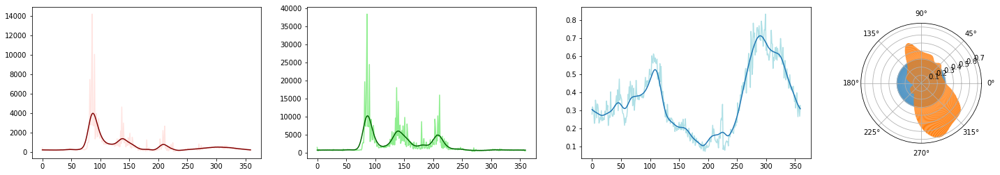

L and Q scores for cell cluster: 33


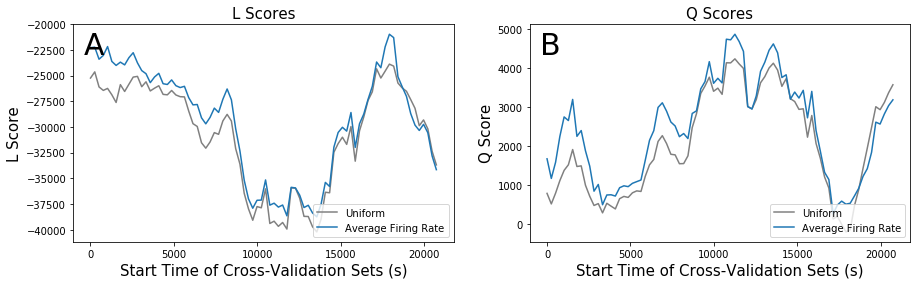

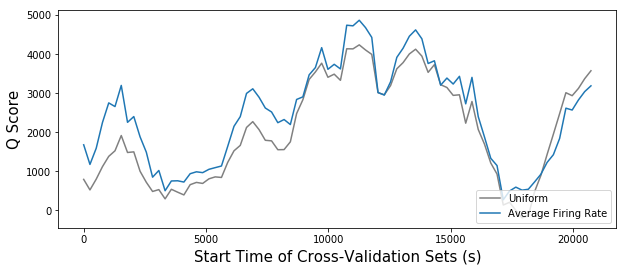

In [9]:
### Compute training and cross-validation sets on a sliding CV window for a single cell cluster ###

#which neuron?
clus_idx = 33

#Set indeces (In this case, 0-874004 are the HD indeces)
set_HD_startIdx = 0
set_HD_endIdx = 870000
cv_set_size = 50000
cv_set_step = 10000


from scipy import ndimage
from scipy.stats import vonmises

#Lists to store the L and Q scores
curClus_avgFir_L_scores = []
curClus_uniform_L_scores = []
curClus_avgFir_Q_scores = []
curClus_uniform_Q_scores = []


#Iterate through this sliding window of cross-validation sets
for cvSet_startIdx in range(set_HD_startIdx, (set_HD_endIdx-cv_set_size) , cv_set_step):
    #Acquire the two halfs of the training set spike histograms and combine
    training_A_spkHist = get_spk_histogram(set_HD_startIdx, cvSet_startIdx, clus_idx)
    training_B_spkHist = get_spk_histogram(cvSet_startIdx+cv_set_size, set_HD_endIdx, clus_idx)
    training_spkHist = np.concatenate((training_A_spkHist,training_B_spkHist))
    #Acquire the two halfs of the traning set head direction (radians) and combine
    training_A_hd = get_HD_rads(set_HD_startIdx, cvSet_startIdx)
    training_B_hd = get_HD_rads(cvSet_startIdx+cv_set_size, set_HD_endIdx)
    training_hd_rads = np.concatenate((training_A_hd,training_B_hd))
    
    #Get the spike to radian histogram and smooth
    spkHD_hist = np.histogram(training_hd_rads, bins=360, range=(0,2*np.pi), weights=training_spkHist)[0].astype(float)
    spkHD_hist_smoothed = ndimage.filters.gaussian_filter(spkHD_hist,6,mode='wrap')
    
    #Get the radian occupancy histogram and smooth
    timeHD_hist = np.histogram(training_hd_rads, bins=360, range=(0,2*np.pi))[0].astype(float)
    timeHD_hist_smoothed = ndimage.filters.gaussian_filter(timeHD_hist,6,mode='wrap')
    
    #Compute the head direction (averaged firing rate) field
    HD_field_preSmoothed = np.divide(spkHD_hist_smoothed, timeHD_hist_smoothed)
    HD_field_rawUnsmoothed = np.divide(spkHD_hist, timeHD_hist+np.finfo(float).eps) #Purely for visualization purpose
    
    #Compute a uniform firing rate for a uniform head-direction field
    HD_field_uniform = [ float(sum(training_spkHist)) / float(len(training_spkHist)) ] * 360
    
     
    #Visualize only the first trained head direction field
    if cvSet_startIdx == set_HD_startIdx:
        print("Cluster %d (only first CV window)\tSpike histogram, Time histogram, Pre-smoothed Field, Polar Field"%clus_idx)
        #Set up figure
        fig, ax = plt.subplots(1,3)
        fig.set_figwidth(20)
        #Plot the spiking histogram
        ax[0].plot(spkHD_hist,color='mistyrose')
        ax[0].plot(spkHD_hist_smoothed, color='maroon')
        #Plot the total time spent histogram
        ax[1].plot(timeHD_hist,color='lightgreen')
        ax[1].plot(timeHD_hist_smoothed,color='darkgreen')
        #Plot the pre-smoothed
        ax[2].plot(HD_field_rawUnsmoothed,color='powderblue')
        ax[2].plot(HD_field_preSmoothed,color='#1f77b4')
        #polar plot
        polar_ax = fig.add_axes([0.71, 0.2, 0.6, 0.6], polar=True)
        polar_ax.bar(np.linspace(0.0,2*np.pi,360,endpoint=False), HD_field_uniform, width=(2.0*np.pi/360))
        polar_ax.bar(np.linspace(0.0,2*np.pi,360,endpoint=False), HD_field_preSmoothed, width=(2.0*np.pi/360))
        plt.show()

    
    #Acquire the cross-validaiton set
    cv_spkHist = get_spk_histogram(cvSet_startIdx, cvSet_startIdx+cv_set_size, clus_idx)
    cv_hd_rads = get_HD_rads(cvSet_startIdx, cvSet_startIdx+cv_set_size)
    
    #Compute L scores
    L_val_avgFirRate = compute_L_val(HD_field_preSmoothed, cv_hd_rads, cv_spkHist)
    L_val_uniform = compute_L_val(HD_field_uniform, cv_hd_rads, cv_spkHist)
    #Compute Q scores
    Q_val_avgFirRate = compute_Q_val(HD_field_preSmoothed, cv_hd_rads, cv_spkHist)
    Q_val_uniform = compute_Q_val(HD_field_uniform, cv_hd_rads, cv_spkHist)
    
    #Append values
    curClus_avgFir_L_scores.append(L_val_avgFirRate)
    curClus_uniform_L_scores.append(L_val_uniform)
    curClus_avgFir_Q_scores.append(Q_val_avgFirRate)
    curClus_uniform_Q_scores.append(Q_val_uniform)
    




#Visualize L and Q scores
print("L and Q scores for cell cluster: %d" % clus_idx)

#### Visualize as subplots
fig, ax = plt.subplots(1,2)
fig.set_figwidth(15)
plotting_timeRange = [(startIdx/39.06) for startIdx in range(set_HD_startIdx, (set_HD_endIdx-cv_set_size) , cv_set_step)]
#Plot L values
ax[0].plot(plotting_timeRange, curClus_uniform_L_scores,color='gray') 
ax[0].plot(plotting_timeRange,curClus_avgFir_L_scores,color='#1f77b4')
ax[0].set_title("L Scores", fontsize=15)
ax[0].set_xlabel('Start Time of Cross-Validation Sets (s)', fontsize=15)
ax[0].set_ylabel('L Score', fontsize=15)
ax[0].legend(['Uniform','Average Firing Rate'], loc=4)
ax[0].text(0.135, 0.775, "A", fontsize=30, transform=plt.gcf().transFigure)
#Plot Q values
ax[1].plot(plotting_timeRange,curClus_uniform_Q_scores,color='gray') 
ax[1].plot(plotting_timeRange,curClus_avgFir_Q_scores,color='#1f77b4')
ax[1].set_title("Q Scores", fontsize=15)
ax[1].set_xlabel('Start Time of Cross-Validation Sets (s)', fontsize=15)
ax[1].set_ylabel('Q Score', fontsize=15)
ax[1].legend(['Uniform','Average Firing Rate'], loc=4)
ax[1].text(0.557, 0.775, "B", fontsize=30, transform=plt.gcf().transFigure)
plt.show()


#Plot just Q
plt.figure(figsize=(10,4))
plt.plot(plotting_timeRange,curClus_uniform_Q_scores,color='gray') 
plt.plot(plotting_timeRange,curClus_avgFir_Q_scores,color='#1f77b4')
plt.xlabel('Start Time of Cross-Validation Sets (s)', fontsize=15)
plt.ylabel('Q Score', fontsize=15)
plt.legend(['Uniform','Average Firing Rate'], loc=4)
plt.show()


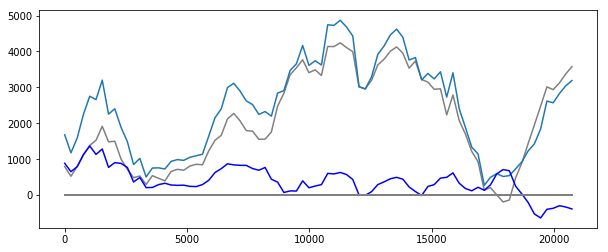

In [10]:
### Difference in the Q score ###
#TODO: not yet done.
"""
plotting_timeRange,curClus_uniform_Q_scores,color='gray') 
plt.plot(plotting_timeRange,curClus_avgFir_Q_scores
"""

diff_Q_scores = np.subtract(curClus_avgFir_Q_scores,curClus_uniform_Q_scores)

plt.figure(figsize=(10,4))
plt.plot(plotting_timeRange,curClus_uniform_Q_scores,color='gray') 
plt.plot(plotting_timeRange,curClus_avgFir_Q_scores,color='#1f77b4')
plt.plot(plotting_timeRange,diff_Q_scores,color='blue')
#Plot 0 line
plt.plot([plotting_timeRange[0],plotting_timeRange[-1]], [0.0,0.0],linewidth=2, color='grey')
plt.show()



L and Q scores for cell cluster: 0


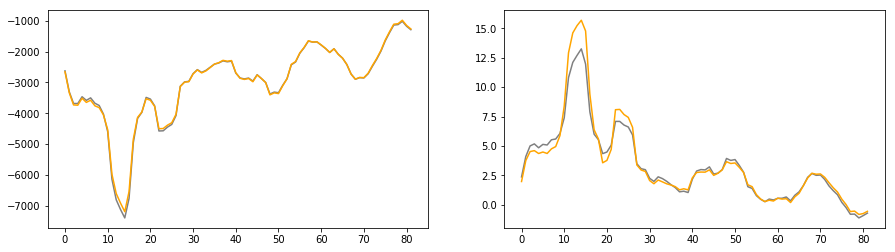

L and Q scores for cell cluster: 1


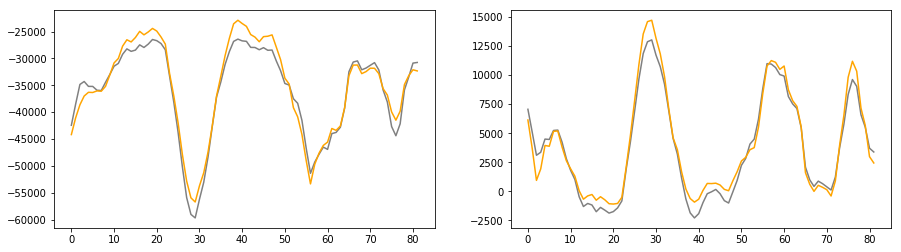

L and Q scores for cell cluster: 2


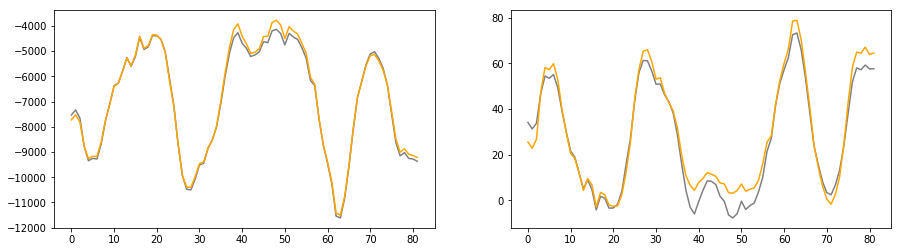

L and Q scores for cell cluster: 3


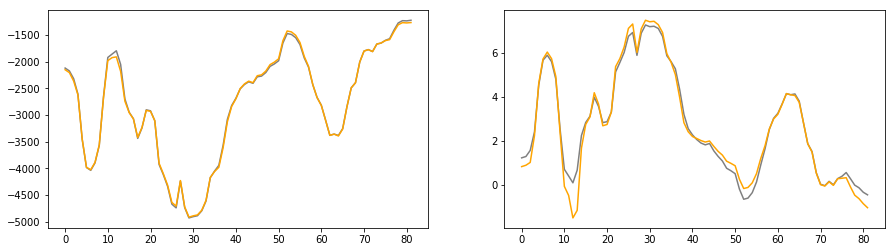

L and Q scores for cell cluster: 4


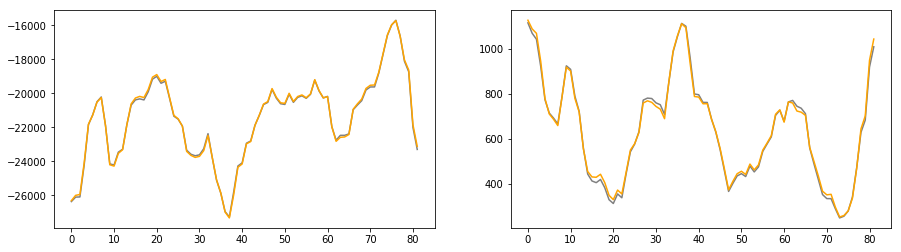

L and Q scores for cell cluster: 5


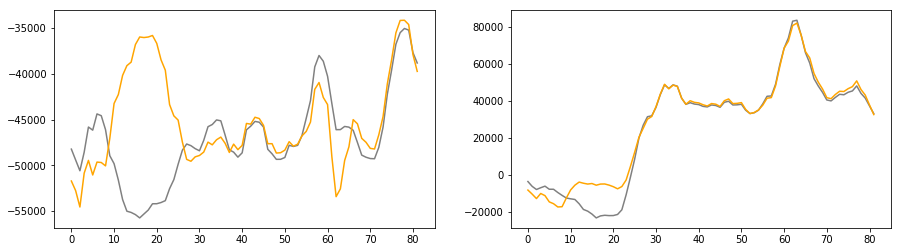

L and Q scores for cell cluster: 6


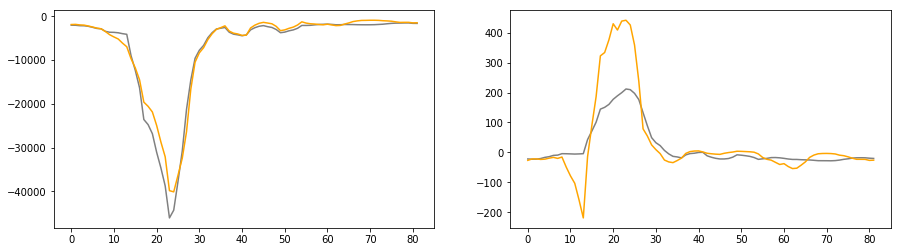

L and Q scores for cell cluster: 7


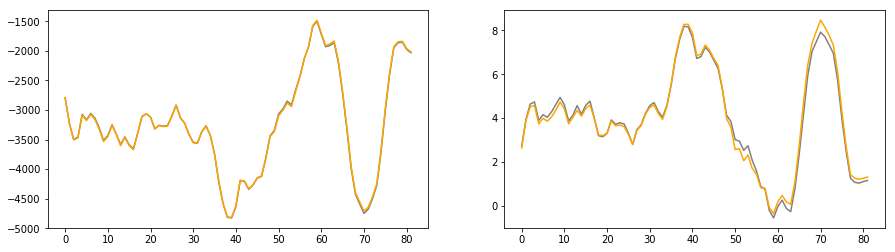

L and Q scores for cell cluster: 8


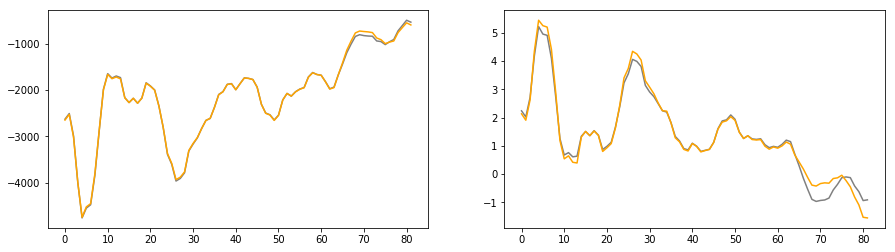

L and Q scores for cell cluster: 9


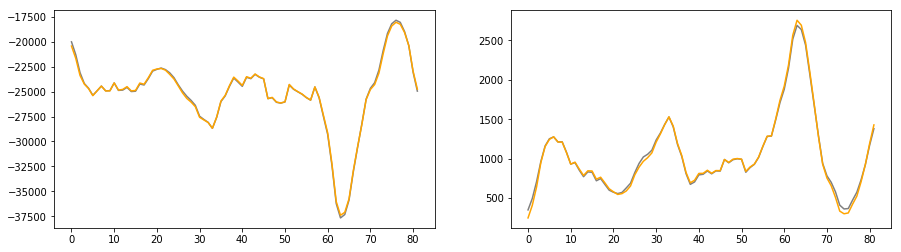

L and Q scores for cell cluster: 10


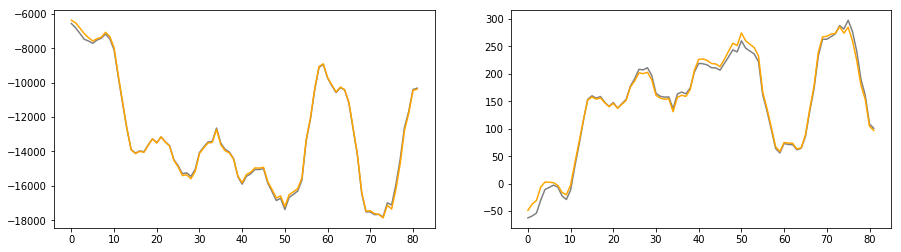

L and Q scores for cell cluster: 11


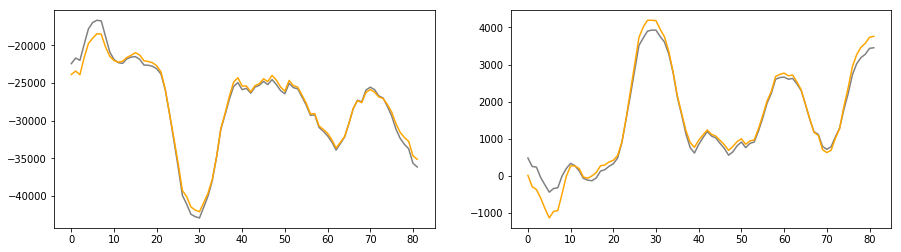

L and Q scores for cell cluster: 12


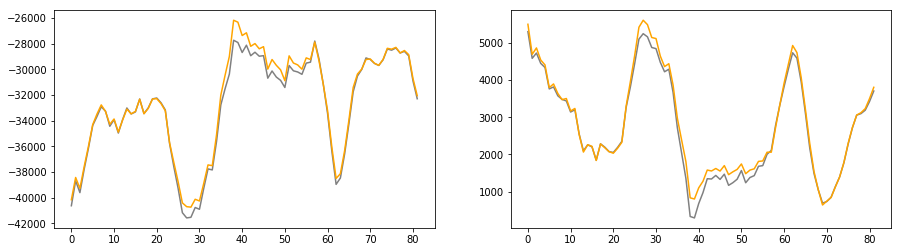

L and Q scores for cell cluster: 13


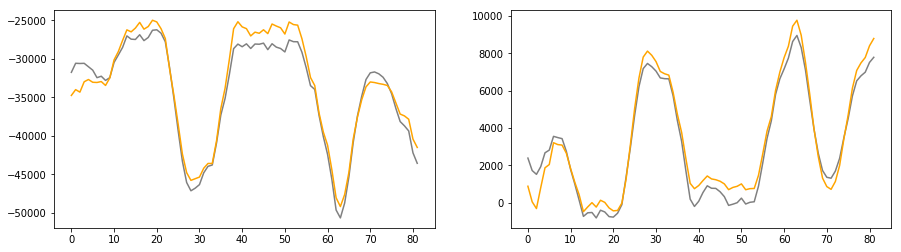

L and Q scores for cell cluster: 14


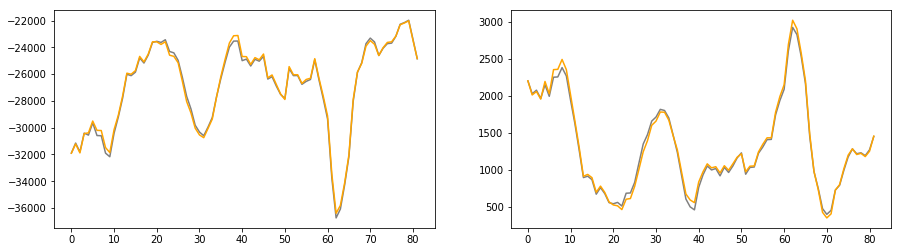

L and Q scores for cell cluster: 15


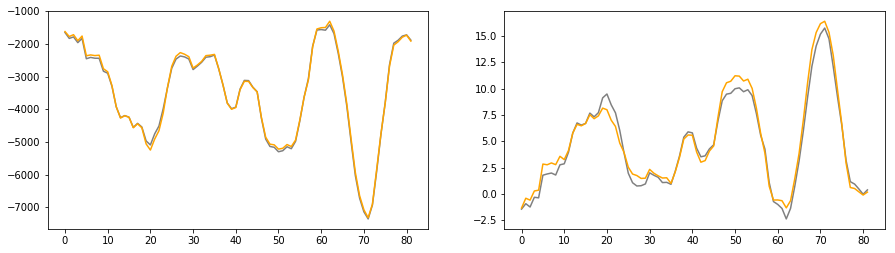

L and Q scores for cell cluster: 16


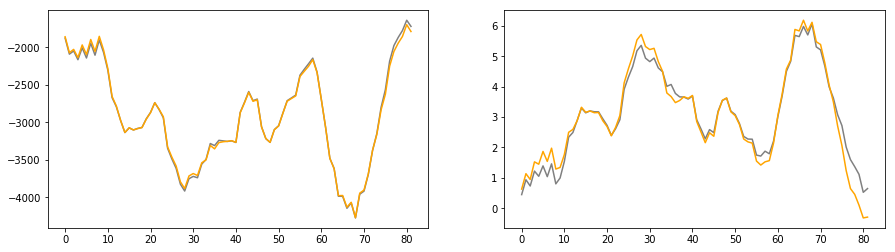

L and Q scores for cell cluster: 17


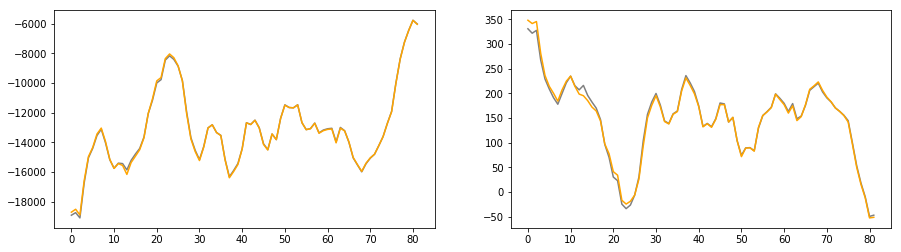

L and Q scores for cell cluster: 18


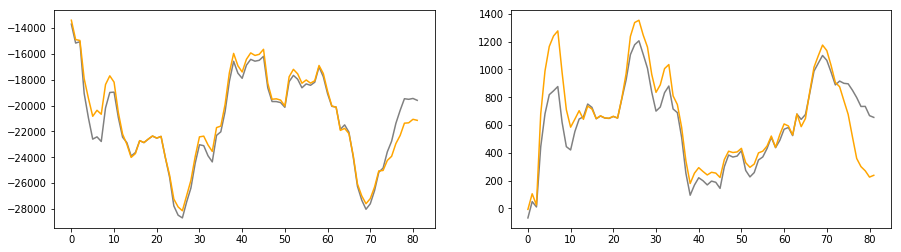

L and Q scores for cell cluster: 19


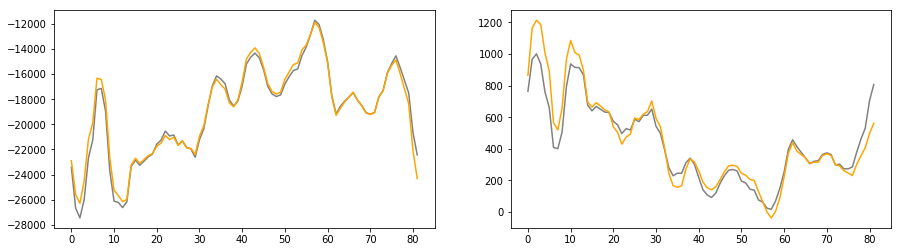

L and Q scores for cell cluster: 20


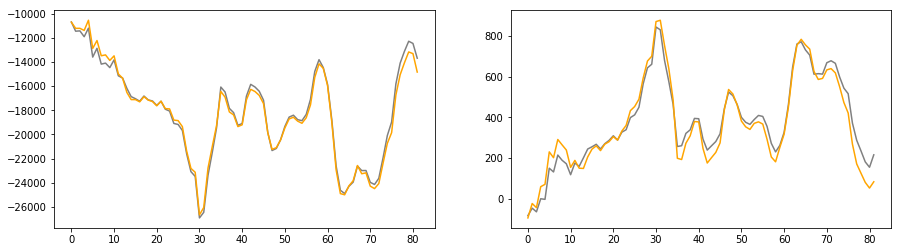

L and Q scores for cell cluster: 21


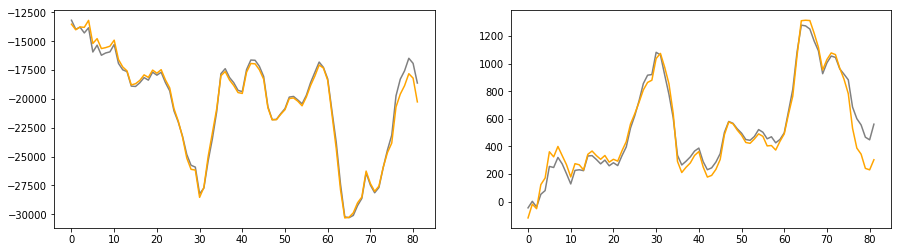

L and Q scores for cell cluster: 22


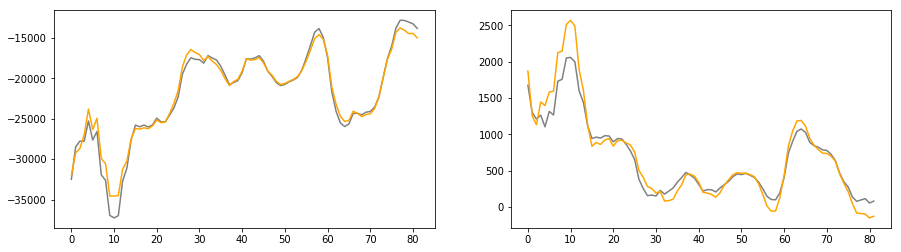

L and Q scores for cell cluster: 23


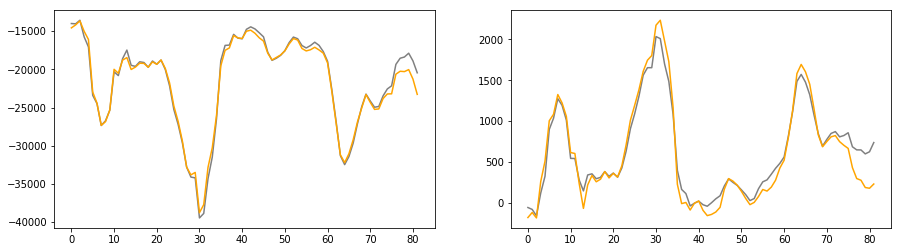

L and Q scores for cell cluster: 24


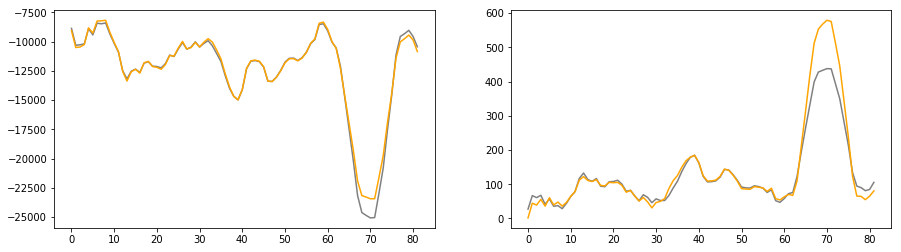

L and Q scores for cell cluster: 25


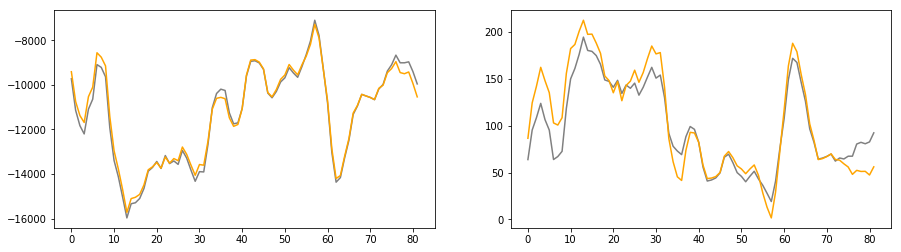

L and Q scores for cell cluster: 26


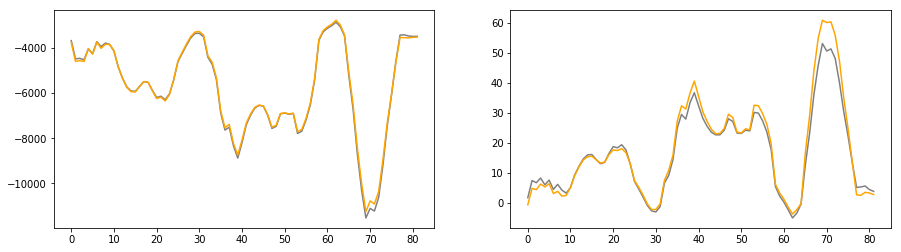

L and Q scores for cell cluster: 27


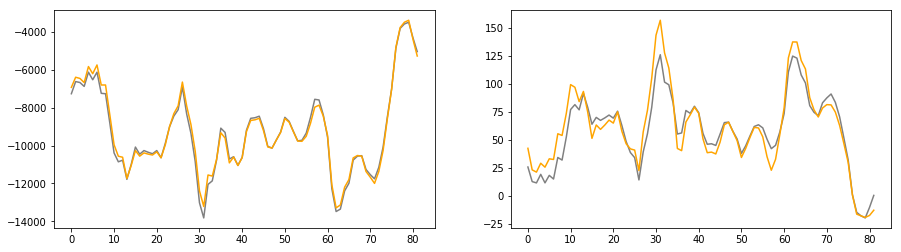

L and Q scores for cell cluster: 28


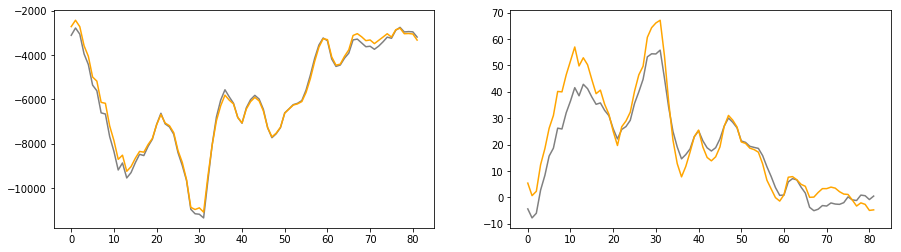

L and Q scores for cell cluster: 29


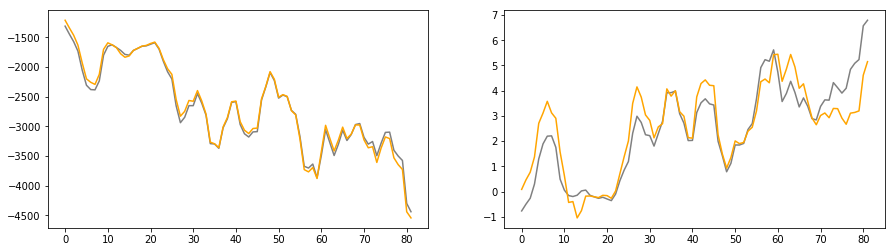

L and Q scores for cell cluster: 30


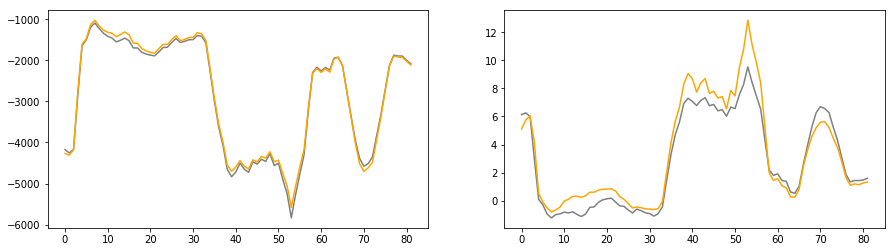

L and Q scores for cell cluster: 31


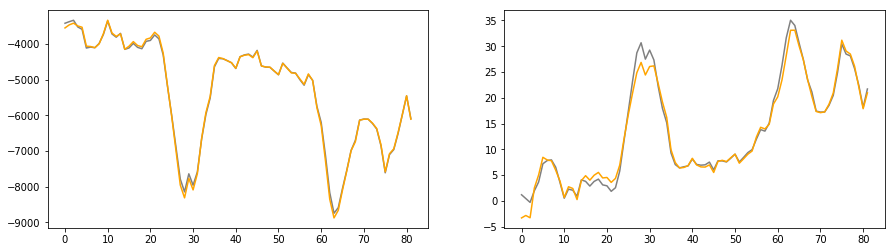

L and Q scores for cell cluster: 32


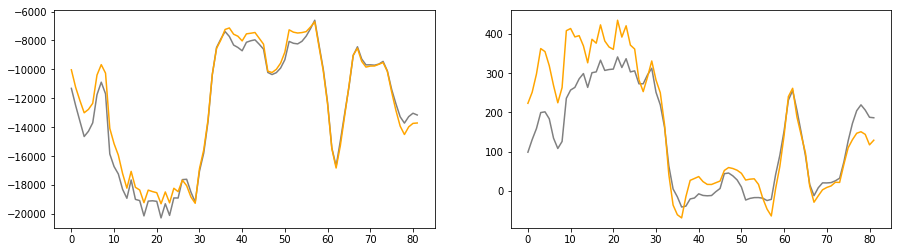

L and Q scores for cell cluster: 33


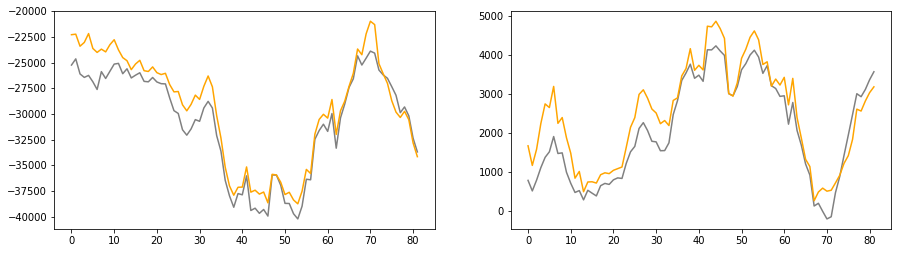

L and Q scores for cell cluster: 34


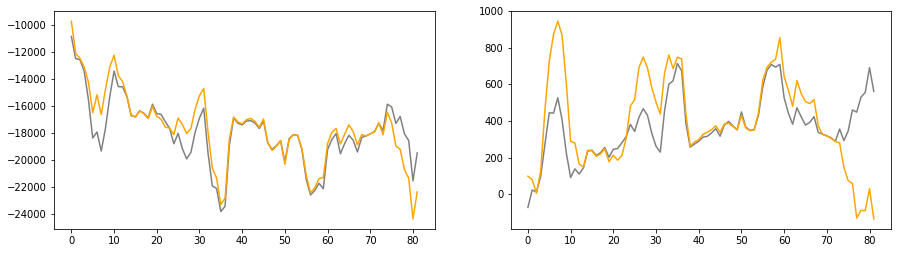

L and Q scores for cell cluster: 35


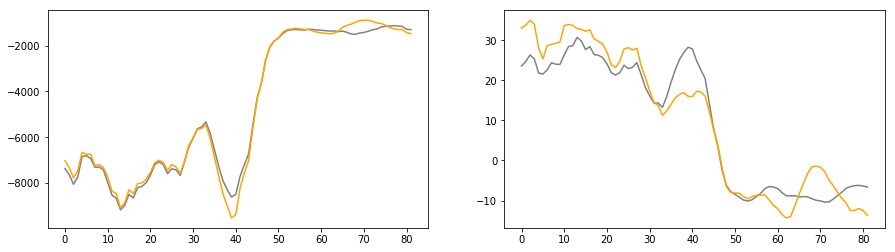

L and Q scores for cell cluster: 36


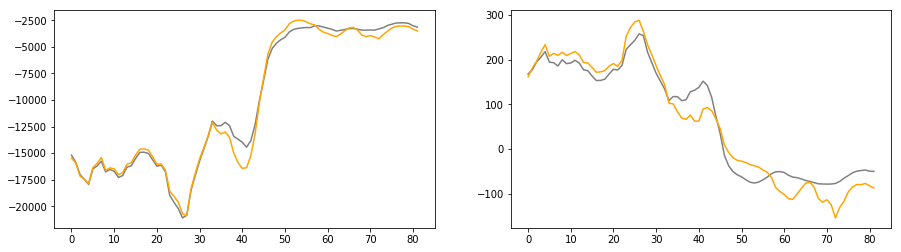

L and Q scores for cell cluster: 37


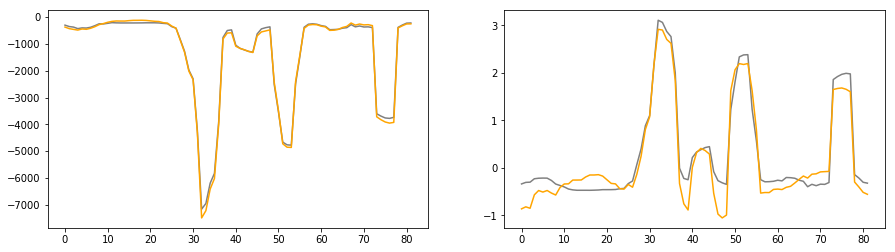

L and Q scores for cell cluster: 38


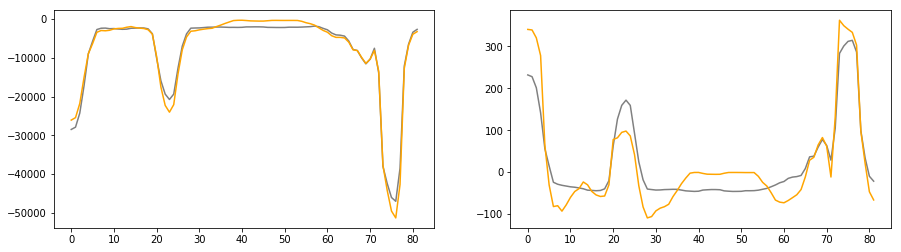

L and Q scores for cell cluster: 39


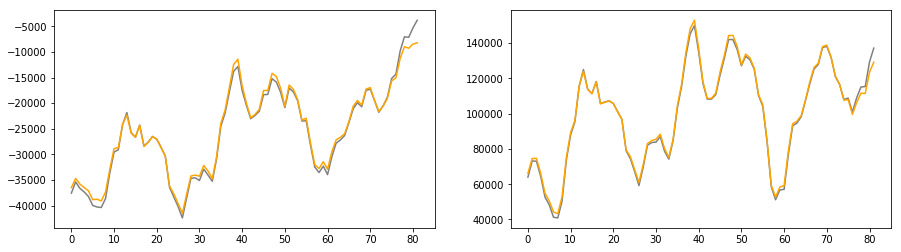

L and Q scores for cell cluster: 40


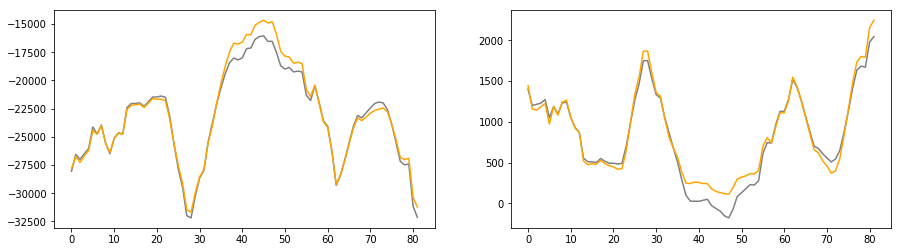

In [11]:
### Compute training and cross-validation sets on a sliding CV window for all cell clusters ###


#Set indeces (In this case, 0-874004 are the HD indeces)
set_HD_startIdx = 0
set_HD_endIdx = 870000
cv_set_size = 50000
cv_set_step = 10000


from scipy import ndimage

allClus_avgFir_L_scores = []
allClus_uniform_L_scores = []
allClus_avgFir_Q_scores = []
allClus_uniform_Q_scores = []


for clus_idx in range(0,len(raw_clus_spkTimes)):
    #Lists to store the L and Q scores
    curClus_avgFir_L_scores = []
    curClus_uniform_L_scores = []
    curClus_avgFir_Q_scores = []
    curClus_uniform_Q_scores = []


    #Iterate through this sliding window of cross-validation sets
    for cvSet_startIdx in range(set_HD_startIdx, (set_HD_endIdx-cv_set_size) , cv_set_step):
        #Acquire the two halfs of the training set spike histograms and combine
        training_A_spkHist = get_spk_histogram(set_HD_startIdx, cvSet_startIdx, clus_idx)
        training_B_spkHist = get_spk_histogram(cvSet_startIdx+cv_set_size, set_HD_endIdx, clus_idx)
        training_spkHist = np.concatenate((training_A_spkHist,training_B_spkHist))
        #Acquire the two halfs of the traning set head direction (radians) and combine
        training_A_hd = get_HD_rads(set_HD_startIdx, cvSet_startIdx)
        training_B_hd = get_HD_rads(cvSet_startIdx+cv_set_size, set_HD_endIdx)
        training_hd_rads = np.concatenate((training_A_hd,training_B_hd))

        #Get the spike to radian histogram and smooth
        spkHD_hist = np.histogram(training_hd_rads, bins=360, range=(0,2*np.pi), weights=training_spkHist)[0].astype(float)
        spkHD_hist_smoothed = ndimage.filters.gaussian_filter(spkHD_hist,6,mode='wrap')

        #Get the radian occupancy histogram and smooth
        timeHD_hist = np.histogram(training_hd_rads, bins=360, range=(0,2*np.pi))[0].astype(float)
        timeHD_hist_smoothed = ndimage.filters.gaussian_filter(timeHD_hist,6,mode='wrap')

        #Compute the head direction (averaged firing rate) field
        HD_field_preSmoothed = np.divide(spkHD_hist_smoothed, timeHD_hist_smoothed)
        HD_field_rawUnsmoothed = np.divide(spkHD_hist, timeHD_hist+np.finfo(float).eps) #Purely for visualization purpose

        #Compute a uniform firing rate for a uniform head-direction field
        HD_field_uniform = [ float(sum(training_spkHist)) / float(len(training_spkHist)) ] * 360


        #Acquire the cross-validaiton set
        cv_spkHist = get_spk_histogram(cvSet_startIdx, cvSet_startIdx+cv_set_size, clus_idx)
        cv_hd_rads = get_HD_rads(cvSet_startIdx, cvSet_startIdx+cv_set_size)

        #Compute L scores
        L_val_avgFirRate = compute_L_val(HD_field_preSmoothed, cv_hd_rads, cv_spkHist)
        L_val_uniform = compute_L_val(HD_field_uniform, cv_hd_rads, cv_spkHist)
        #Compute Q scores
        Q_val_avgFirRate = compute_Q_val(HD_field_preSmoothed, cv_hd_rads, cv_spkHist)
        Q_val_uniform = compute_Q_val(HD_field_uniform, cv_hd_rads, cv_spkHist)

        #Append values
        curClus_avgFir_L_scores.append(L_val_avgFirRate)
        curClus_uniform_L_scores.append(L_val_uniform)
        curClus_avgFir_Q_scores.append(Q_val_avgFirRate)
        curClus_uniform_Q_scores.append(Q_val_uniform)
    
    #Append more values
    allClus_avgFir_L_scores.append(curClus_avgFir_L_scores)
    allClus_uniform_L_scores.append(curClus_uniform_L_scores)
    allClus_avgFir_Q_scores.append(curClus_avgFir_Q_scores)
    allClus_uniform_Q_scores.append(curClus_uniform_Q_scores)
    

    #Visualize L and Q scores
    print("L and Q scores for cell cluster: %d" % clus_idx)
    #Visualize as subplots
    fig, ax = plt.subplots(1,2)
    fig.set_figwidth(15)
    #Plot L values
    ax[0].plot(curClus_uniform_L_scores,color='grey') 
    ax[0].plot(curClus_avgFir_L_scores,color='orange') 
    #Plot Q values
    ax[1].plot(curClus_uniform_Q_scores,color='grey') 
    ax[1].plot(curClus_avgFir_Q_scores,color='orange') 
    plt.show()
    

Testing for cell cluster: 0
Difference in L score P-val: 0.021950	Difference in Q score P-val: 0.031450


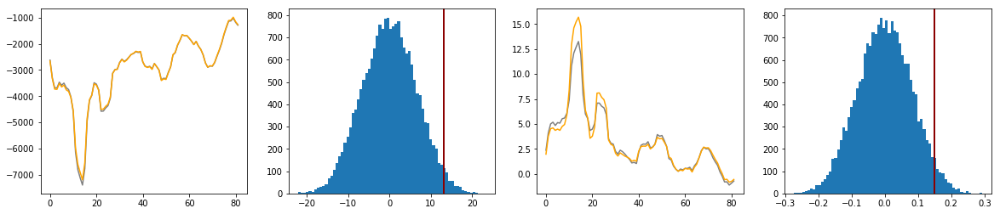

Testing for cell cluster: 1
Difference in L score P-val: 0.000150	Difference in Q score P-val: 0.000150


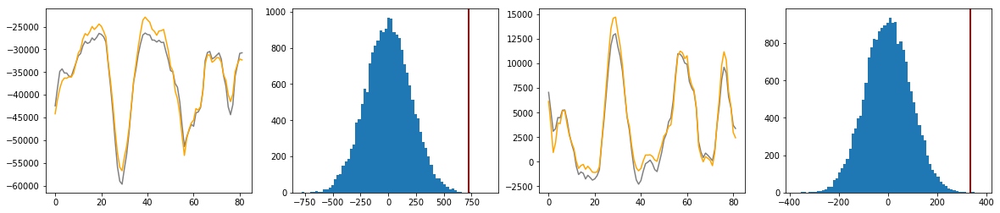

Testing for cell cluster: 2
Difference in L score P-val: 0.000000	Difference in Q score P-val: 0.000000


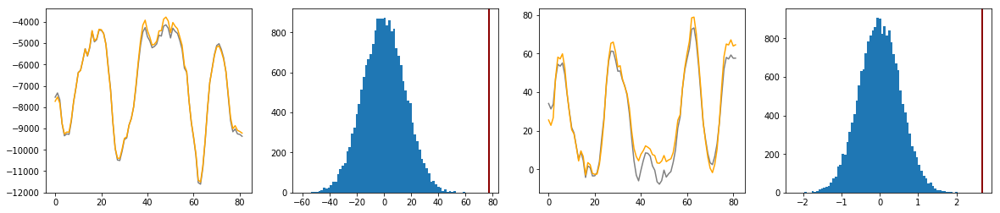

Testing for cell cluster: 3
Difference in L score P-val: 0.771450	Difference in Q score P-val: 0.840500


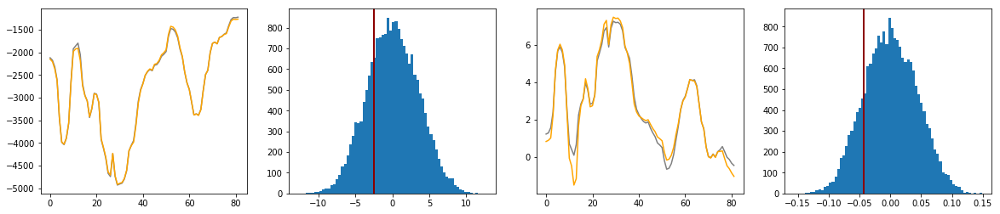

Testing for cell cluster: 4
Difference in L score P-val: 0.005700	Difference in Q score P-val: 0.004950


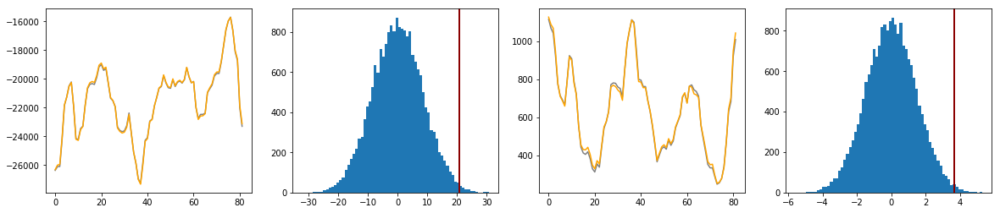

Testing for cell cluster: 5
Difference in L score P-val: 0.004800	Difference in Q score P-val: 0.000950


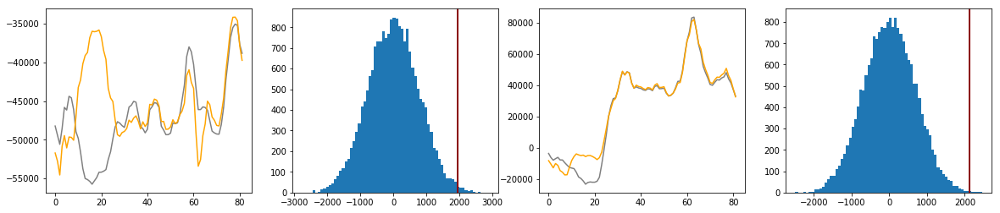

Testing for cell cluster: 6
Difference in L score P-val: 0.002500	Difference in Q score P-val: 0.034200


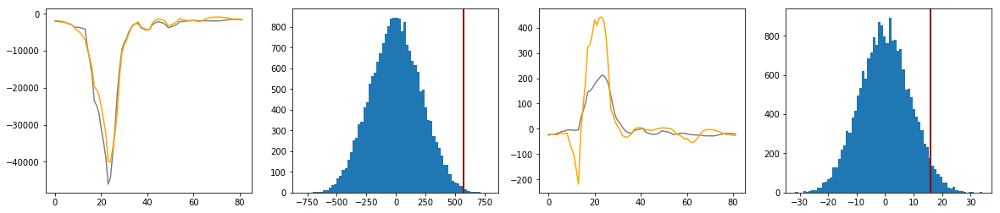

Testing for cell cluster: 7
Difference in L score P-val: 0.092850	Difference in Q score P-val: 0.107050


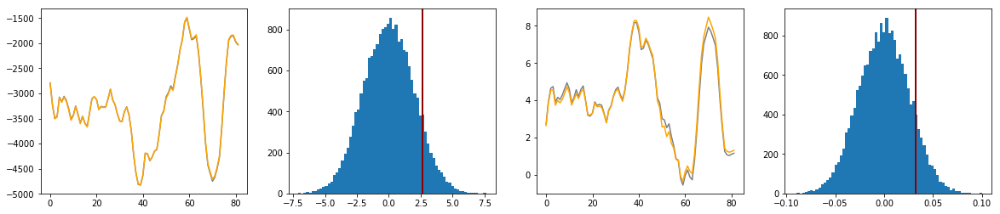

Testing for cell cluster: 8
Difference in L score P-val: 0.051000	Difference in Q score P-val: 0.088900


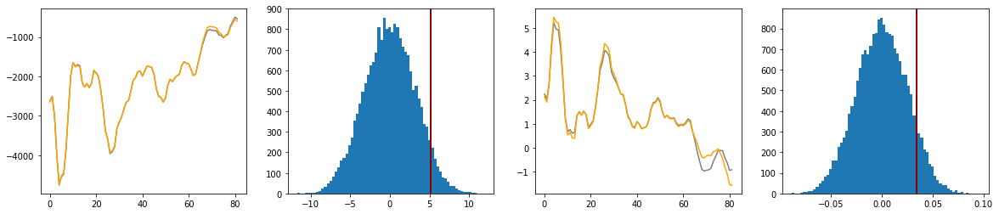

Testing for cell cluster: 9
Difference in L score P-val: 0.844500	Difference in Q score P-val: 0.866100


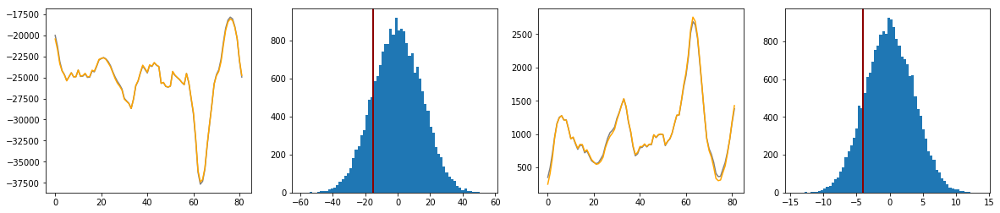

Testing for cell cluster: 10
Difference in L score P-val: 0.023750	Difference in Q score P-val: 0.003900


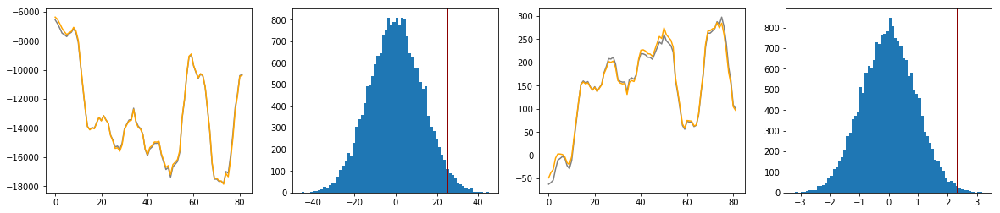

Testing for cell cluster: 11
Difference in L score P-val: 0.114500	Difference in Q score P-val: 0.246750


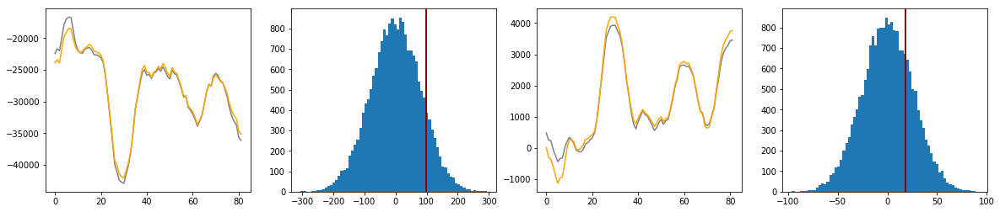

Testing for cell cluster: 12
Difference in L score P-val: 0.000000	Difference in Q score P-val: 0.000000


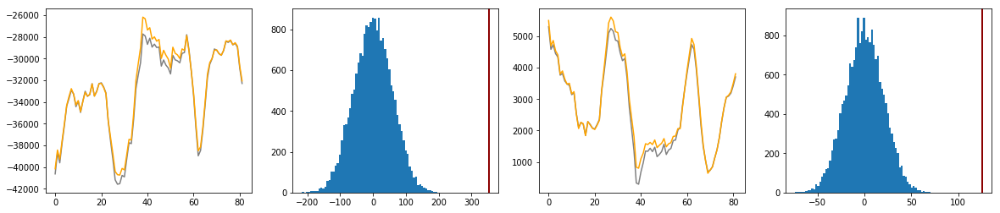

Testing for cell cluster: 13
Difference in L score P-val: 0.000000	Difference in Q score P-val: 0.000050


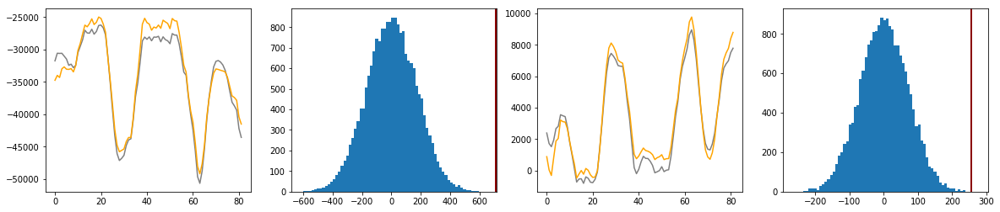

Testing for cell cluster: 14
Difference in L score P-val: 0.002800	Difference in Q score P-val: 0.005800


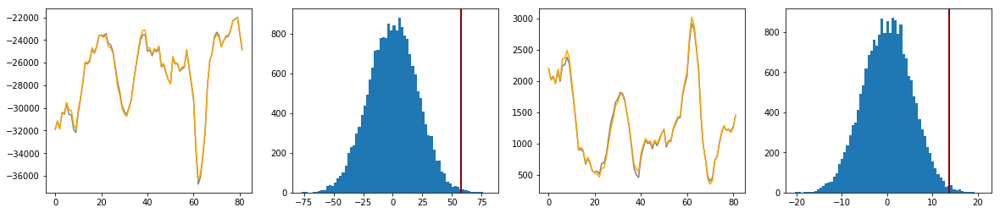

Testing for cell cluster: 15
Difference in L score P-val: 0.000450	Difference in Q score P-val: 0.000100


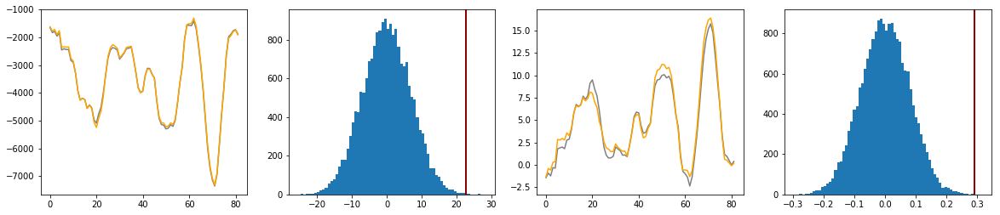

Testing for cell cluster: 16
Difference in L score P-val: 0.615200	Difference in Q score P-val: 0.643150


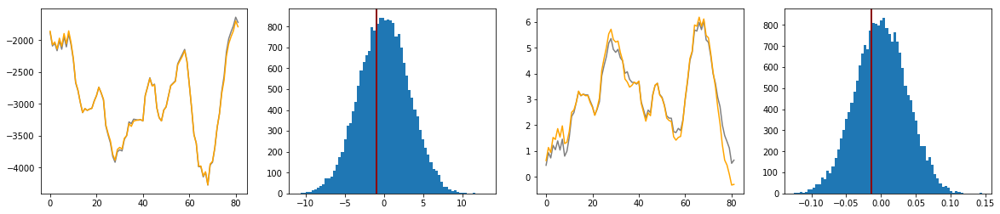

Testing for cell cluster: 17
Difference in L score P-val: 0.537800	Difference in Q score P-val: 0.481200


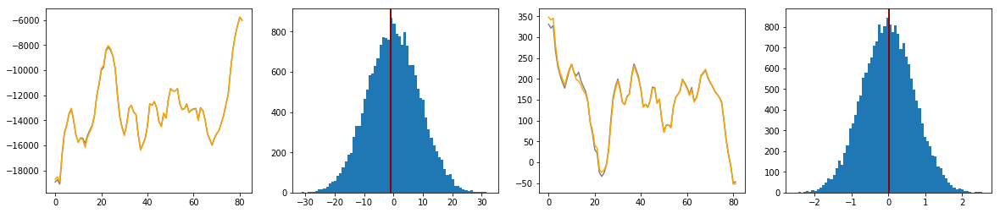

Testing for cell cluster: 18
Difference in L score P-val: 0.003000	Difference in Q score P-val: 0.023900


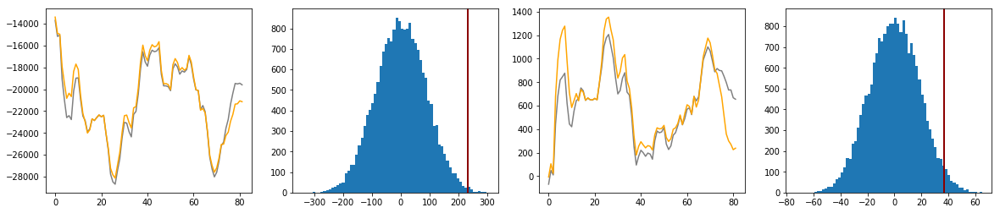

Testing for cell cluster: 19
Difference in L score P-val: 0.020400	Difference in Q score P-val: 0.035900


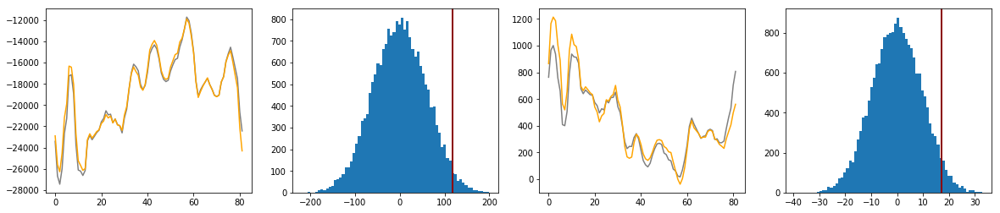

Testing for cell cluster: 20
Difference in L score P-val: 0.967950	Difference in Q score P-val: 0.978450


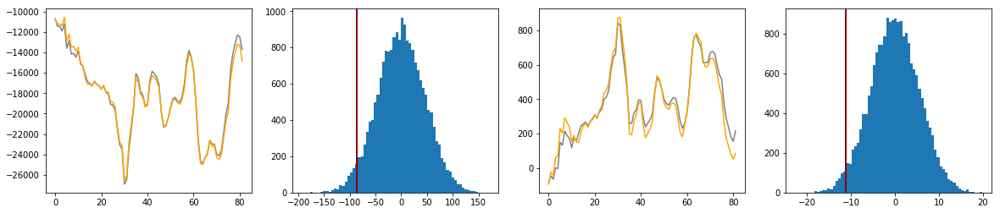

Testing for cell cluster: 21
Difference in L score P-val: 0.949400	Difference in Q score P-val: 0.960300


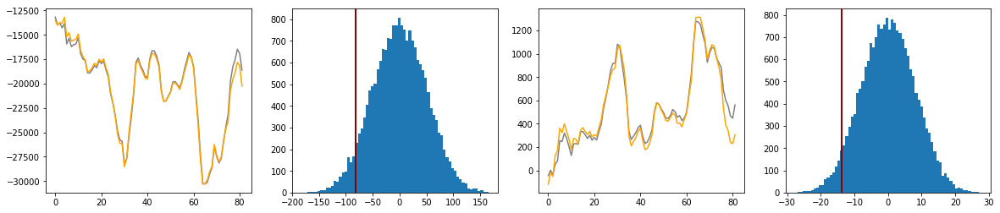

Testing for cell cluster: 22
Difference in L score P-val: 0.029050	Difference in Q score P-val: 0.068650


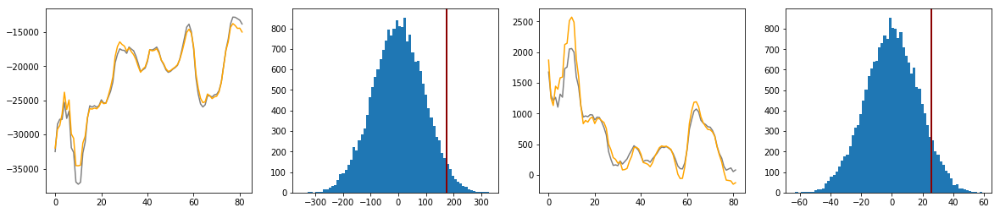

Testing for cell cluster: 23
Difference in L score P-val: 0.989250	Difference in Q score P-val: 0.975100


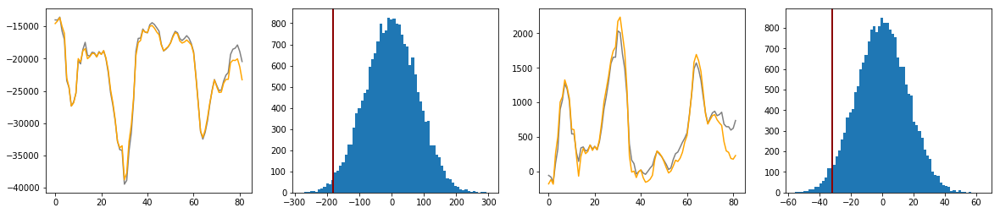

Testing for cell cluster: 24
Difference in L score P-val: 0.001500	Difference in Q score P-val: 0.005150


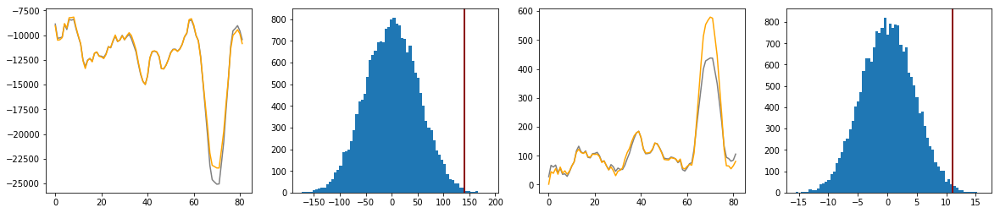

Testing for cell cluster: 25
Difference in L score P-val: 0.006600	Difference in Q score P-val: 0.004600


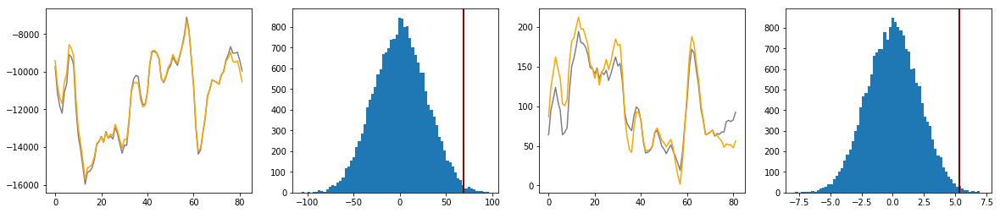

Testing for cell cluster: 26
Difference in L score P-val: 0.000000	Difference in Q score P-val: 0.000200


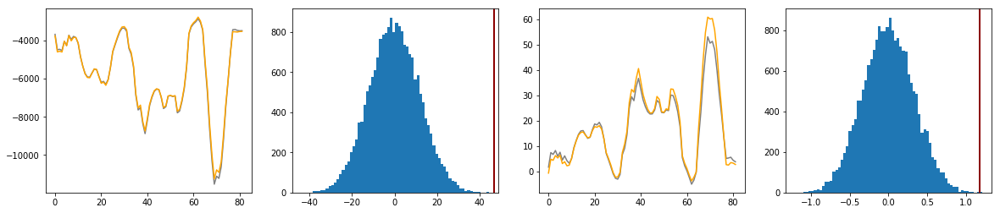

Testing for cell cluster: 27
Difference in L score P-val: 0.009950	Difference in Q score P-val: 0.027500


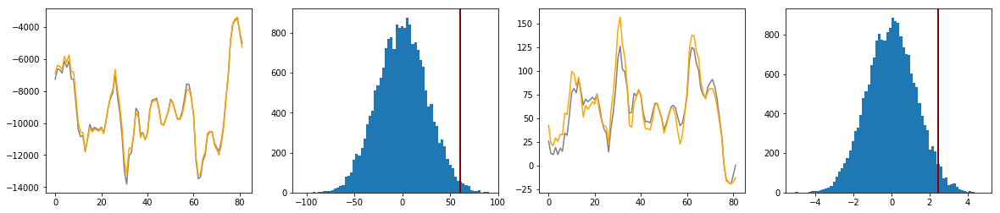

Testing for cell cluster: 28
Difference in L score P-val: 0.000000	Difference in Q score P-val: 0.000000


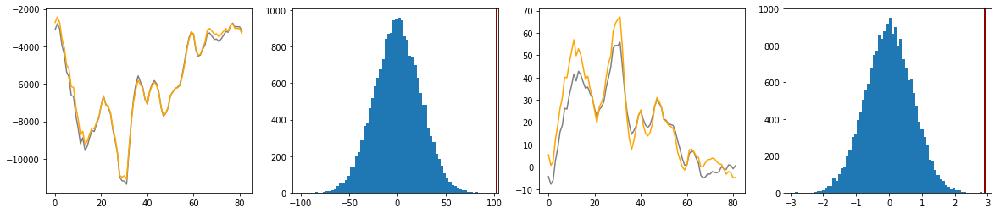

Testing for cell cluster: 29
Difference in L score P-val: 0.027400	Difference in Q score P-val: 0.101000


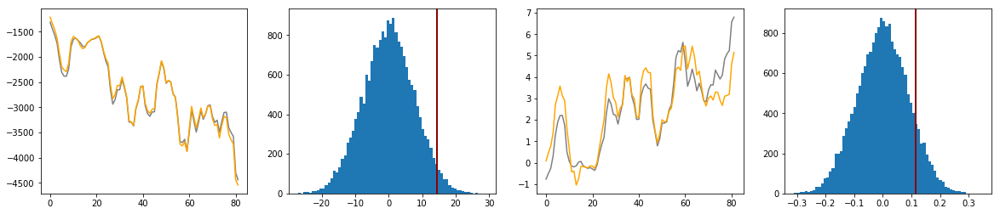

Testing for cell cluster: 30
Difference in L score P-val: 0.000000	Difference in Q score P-val: 0.000000


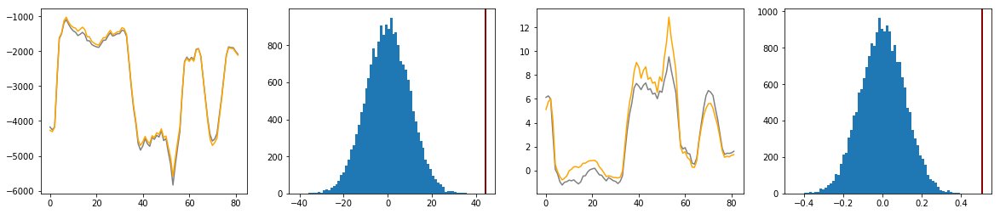

Testing for cell cluster: 31
Difference in L score P-val: 0.928300	Difference in Q score P-val: 0.960500


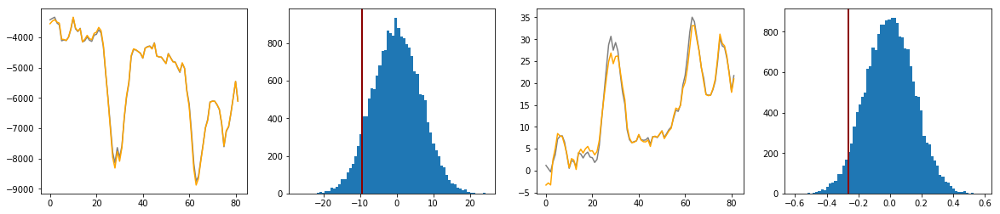

Testing for cell cluster: 32
Difference in L score P-val: 0.000000	Difference in Q score P-val: 0.000000


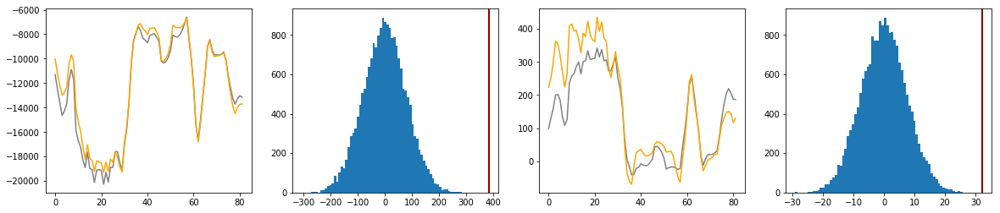

Testing for cell cluster: 33
Difference in L score P-val: 0.000000	Difference in Q score P-val: 0.000000


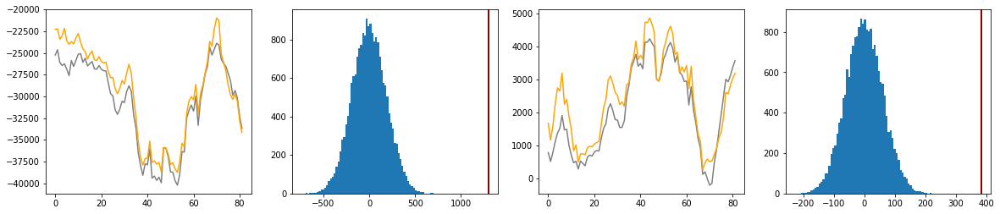

Testing for cell cluster: 34
Difference in L score P-val: 0.009200	Difference in Q score P-val: 0.133950


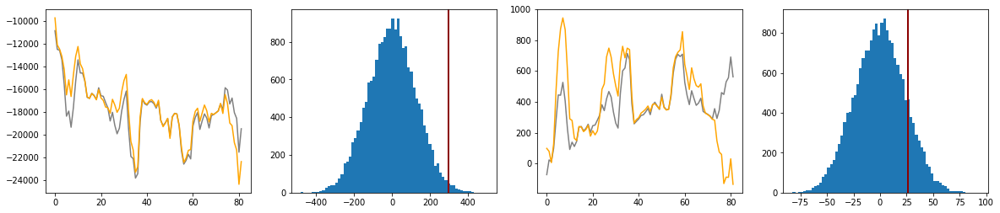

Testing for cell cluster: 35
Difference in L score P-val: 0.238800	Difference in Q score P-val: 0.155350


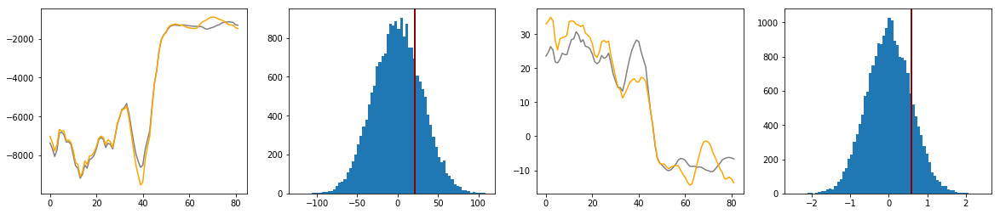

Testing for cell cluster: 36
Difference in L score P-val: 0.948350	Difference in Q score P-val: 0.942250


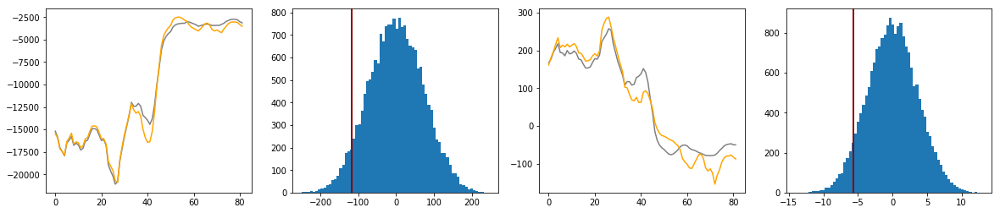

Testing for cell cluster: 37
Difference in L score P-val: 0.995400	Difference in Q score P-val: 0.999500


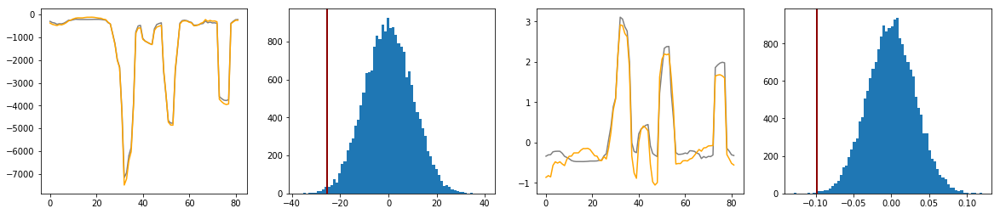

Testing for cell cluster: 38
Difference in L score P-val: 0.350350	Difference in Q score P-val: 0.568000


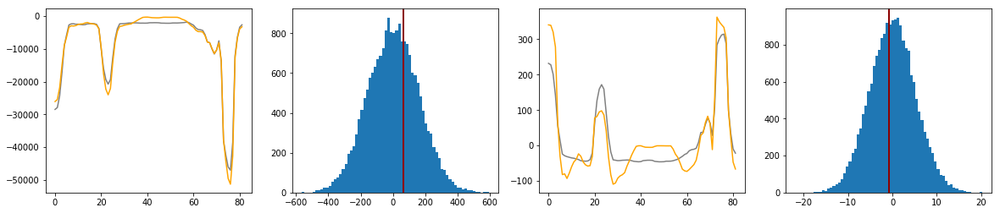

Testing for cell cluster: 39
Difference in L score P-val: 0.001050	Difference in Q score P-val: 0.000250


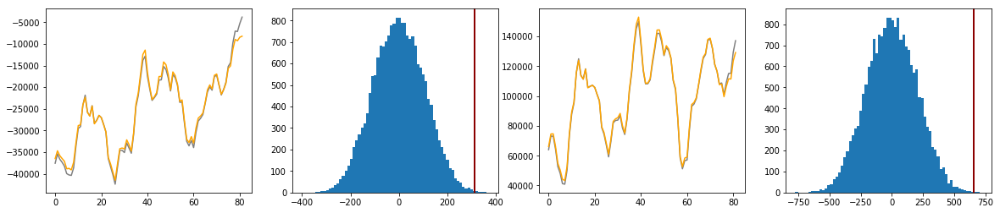

Testing for cell cluster: 40
Difference in L score P-val: 0.000000	Difference in Q score P-val: 0.000050


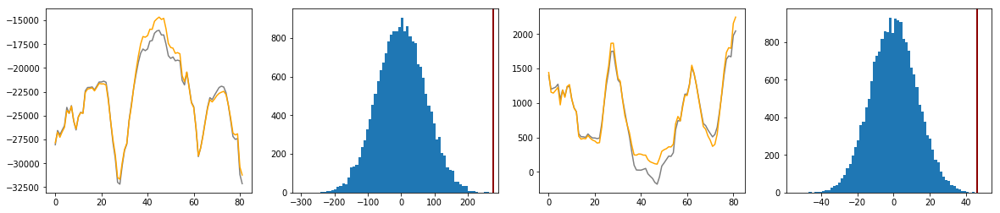

In [12]:
### Permutation test on the mean of the L and Q scores between models ###

N_PERMUTATIONS = 20000

#Distributions and test stats
L_diff_nullDistri_arr = []
L_diff_actual_arr = []
Q_diff_nullDistri_arr = []
Q_diff_actual_arr = []


#P values
pVal_Lscores = []
pVal_Qscores = []


#Iterate through each cell cluster
for clus_idx in range(0,len(allClus_avgFir_L_scores)):
    print("Testing for cell cluster: %d" % clus_idx)
    
    ### Get the difference in scores between the two models and average ###
    L_diff_meaned = np.mean(np.subtract(allClus_avgFir_L_scores[clus_idx], allClus_uniform_L_scores[clus_idx]) )
    Q_diff_meaned = np.mean(np.subtract(allClus_avgFir_Q_scores[clus_idx], allClus_uniform_Q_scores[clus_idx]) )
    
    #Arrays to store the null distribution
    L_diff_nullDistri = [0.0]*N_PERMUTATIONS
    Q_diff_nullDistri = [0.0]*N_PERMUTATIONS
    
    
    #Length of the score array
    len_scores = len(allClus_avgFir_L_scores[clus_idx])
    
    ### Generate null distribution ###
    for nth_permute in range(0,N_PERMUTATIONS):
        ## Generate a binary array for whether or not to switch, each trial is a Bernoulli trial with p=.5 ##
        bernoulli_arr = np.random.binomial(1, 0.5, size=len_scores)
        bernoulli_neg_arr = np.logical_not(bernoulli_arr).astype(int)
        
        ## Swap the L and Q values to generate two new arrays ##
        # Generate the new "avgFir" and "uniform" array for L scores
        L_swapped_avgFir = (allClus_avgFir_L_scores[clus_idx]*bernoulli_arr) + (allClus_uniform_L_scores[clus_idx]*bernoulli_neg_arr)   
        L_swapped_uniform = (allClus_avgFir_L_scores[clus_idx]*bernoulli_neg_arr) + (allClus_uniform_L_scores[clus_idx]*bernoulli_arr)
        #Take the average and add to null distribtion 
        L_diff_nullDistri[nth_permute] = np.mean(np.subtract(L_swapped_avgFir,L_swapped_uniform))
        
        # ... and also for the Q scores
        Q_swapped_avgFir = (allClus_avgFir_Q_scores[clus_idx]*bernoulli_arr) + (allClus_uniform_Q_scores[clus_idx]*bernoulli_neg_arr)   
        Q_swapped_uniform = (allClus_avgFir_Q_scores[clus_idx]*bernoulli_neg_arr) + (allClus_uniform_Q_scores[clus_idx]*bernoulli_arr)     
        Q_diff_nullDistri[nth_permute] = np.mean(np.subtract(Q_swapped_avgFir,Q_swapped_uniform))
    
    
    ## Append arrays ##
    L_diff_nullDistri_arr.append(L_diff_nullDistri)
    L_diff_actual_arr.append(L_diff_meaned)
    Q_diff_nullDistri_arr.append(Q_diff_nullDistri)
    Q_diff_actual_arr.append(Q_diff_meaned)
    
        
    ### Compute for significance ###
    # Significance of L
    num_L_diff_larger = sum(L_diff_nullDistri > L_diff_meaned)
    L_p_larger = num_L_diff_larger / N_PERMUTATIONS
    pVal_Lscores.append(L_p_larger)
    # Significane of Q
    num_Q_diff_larger = sum(Q_diff_nullDistri > Q_diff_meaned)
    Q_p_larger = num_Q_diff_larger / N_PERMUTATIONS
    pVal_Qscores.append(Q_p_larger)
    print("Difference in L score P-val: %f\tDifference in Q score P-val: %f" % (L_p_larger,Q_p_larger))    
    
    ### Visualize ###
    fig, ax = plt.subplots(1,4)
    fig.set_figwidth(20)
    
    #Plot the L scores over different cross-validations sets
    ax[0].plot(allClus_uniform_L_scores[clus_idx], color='grey')
    ax[0].plot(allClus_avgFir_L_scores[clus_idx], color='orange')
    #Plot the distribution for differences in mean of L values
    ax[1].hist(L_diff_nullDistri, bins=70)
    ax[1].axvline(x=L_diff_meaned, color='darkred', linestyle='-',linewidth=2)
    
    #Plot the Q scores over different cross-validations sets
    ax[2].plot(allClus_uniform_Q_scores[clus_idx], color='grey')
    ax[2].plot(allClus_avgFir_Q_scores[clus_idx], color='orange')
    #Plot the distribution for differences in mean of Q values
    ax[3].hist(Q_diff_nullDistri, bins=70)
    ax[3].axvline(x=Q_diff_meaned, color='darkred', linestyle='-',linewidth=2)
    plt.show()
    


Individual alpha: 0.001220
Significant clusters based on Q score: 13


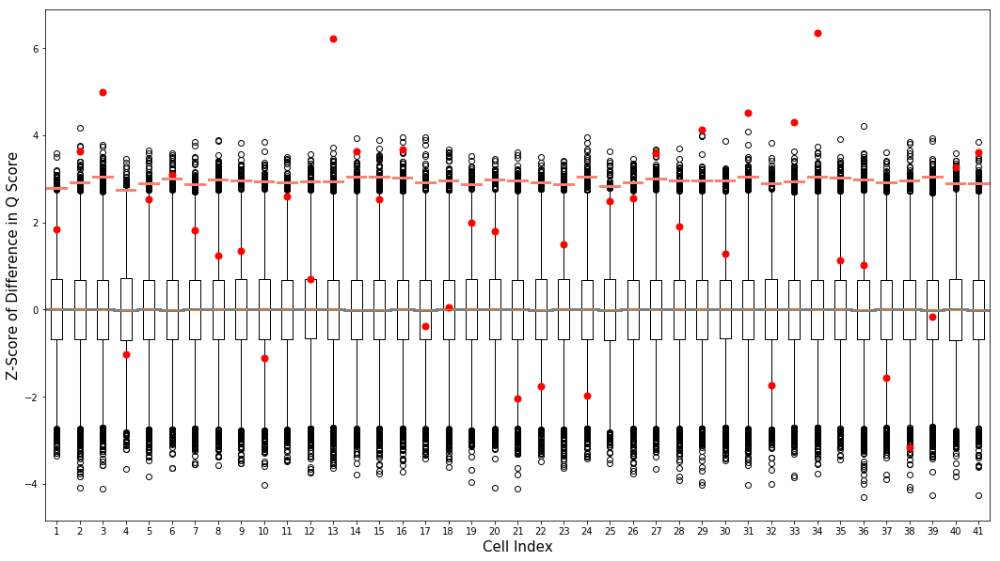

In [17]:
### Compute Boxplot ###
from scipy.stats import zscore

# Significance testing, alpha level #
group_alpha = 0.05
indv_alpha = group_alpha / len(Q_diff_actual_arr)
print("Individual alpha: %f" % indv_alpha )


# Store the actual z-score and cut-off z-score of each distribution
zScores_better_arr = []
zScores_cutOff_arr = []


#Get the z scores of each distributions
Q_z_scores = [zscore(arr) for arr in Q_diff_nullDistri_arr]
#Plot z scores
plt.figure(figsize=(18,10))
plt.boxplot(Q_z_scores)

Q_sig_counter = 0
#Compute the actual stat
for clusIdx in range(0,len(Q_diff_actual_arr)):
    #Get the mean and stdev of each of the null distributions
    null_avg = np.mean(Q_diff_nullDistri_arr[clusIdx])
    null_std = np.std(Q_diff_nullDistri_arr[clusIdx])
    
    #Plot 0
    zero_z = (0.0 - null_avg) / null_std
    zero_xRange = [clusIdx+1.0-0.5, clusIdx+1.0+0.5]
    plt.plot(zero_xRange, [zero_z,zero_z], linewidth=3, color='grey')
    
    #Compute the z score of the CV score and plot
    zScore_better = ( Q_diff_actual_arr[clusIdx] - null_avg ) / null_std
    plt.plot(clusIdx+1.0, zScore_better, 'o', color='red', markersize=7)
    #Append
    zScores_better_arr.append(zScore_better)
    
    
    #Compute the significance cut-off of each distribution (non-parametrically)
    sig_percentile = (1.0 - indv_alpha) * 100
    y_cutOff = np.percentile(Q_diff_nullDistri_arr[clusIdx], sig_percentile)
    #Compute this z score and plot
    z_cutOff = (y_cutOff - null_avg) / null_std
    x_range = [clusIdx+1.0-0.4, clusIdx+1.0+0.4]
    plt.plot(x_range, [z_cutOff,z_cutOff], linewidth=3, color='salmon')
    #Append
    zScores_cutOff_arr.append(z_cutOff)
    
    if zScore_better > z_cutOff:
        Q_sig_counter+=1
        
print("Significant clusters based on Q score: %d" % Q_sig_counter)

#Label diagram and show
plt.xlabel("Cell Index", fontsize=15)
plt.ylabel("Z-Score of Difference in Q Score", fontsize=15)
plt.show()

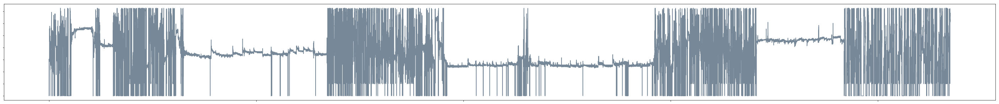

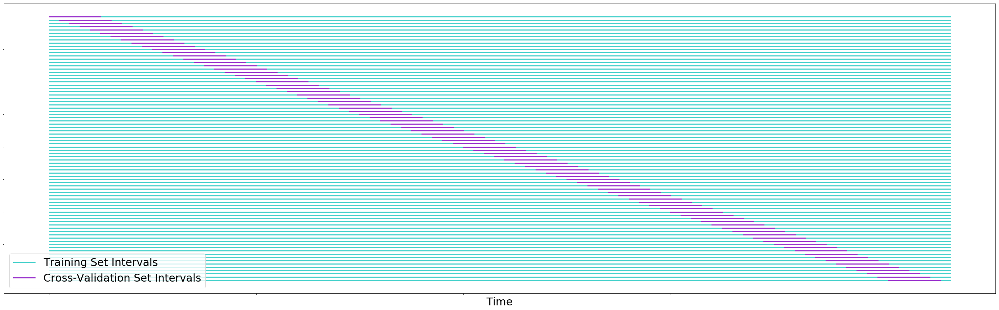

In [18]:
## Visualize the cross-validation sets ##

##TODO: set up significant ones here

#Get the range of HD data that is to used
vis_HD_range = hd_data[set_HD_startIdx:set_HD_endIdx]

#Plot the range of head directions
plt.figure(figsize=(50,5))
plt.plot(vis_HD_range, color='lightslategrey')
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().axes.xaxis.set_ticklabels([])
plt.show()

plt.figure(figsize=(50,15))
y_counter = 0
for cvSet_startIdx in range(set_HD_startIdx, (set_HD_endIdx-cv_set_size) , cv_set_step):
    #Get the x ranges of the training and cross-validation sets
    x_range_training = [set_HD_startIdx,set_HD_endIdx]
    x_range_CV = [cvSet_startIdx, cvSet_startIdx+cv_set_size]
    #Get the y-range of the sets and increment
    y_range = (y_counter, y_counter)
    y_counter -= 1
    
    #Plot the training set range
    plt.plot(x_range_training,y_range, linewidth=3, color='mediumturquoise')
    #Plot the CV set range over the training range
    plt.plot(x_range_CV, y_range, linewidth=3, color='darkorchid')
    

#Label and show
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().axes.xaxis.set_ticklabels([])
plt.xlabel("Time", fontsize=30)
plt.legend(['Training Set Intervals','Cross-Validation Set Intervals'], fontsize=30, loc=3)
plt.show()

In [19]:
### Re-Compute the Smoothed HD field for each cluster ###

#Set indeces (In this case, 0-874004 are the HD indeces)
set_HD_startIdx = 0
set_HD_endIdx = 870000

HD_fields_preSmoothed = []

from scipy import ndimage

#Iterate through all cell clusters
for clus_idx in range(0,len(raw_clus_spkTimes)):
    print(clus_idx)
    #Acquire the spike event histogram per head direction frame
    all_spkHist = get_spk_histogram(set_HD_startIdx, set_HD_endIdx, clus_idx)
    #Acquire the head direction radian per frame
    all_hd_rads = get_HD_rads(set_HD_startIdx, set_HD_endIdx)
    
    #Get the spike to radian histogram and smooth
    spkHD_hist = np.histogram(all_hd_rads, bins=360, range=(0,2*np.pi), weights=all_spkHist)[0].astype(float)
    spkHD_hist_smoothed = ndimage.filters.gaussian_filter(spkHD_hist,6,mode='wrap')
    
    #Get the radian occupancy histogram and smooth
    timeHD_hist = np.histogram(all_hd_rads, bins=360, range=(0,2*np.pi))[0].astype(float)
    timeHD_hist_smoothed = ndimage.filters.gaussian_filter(timeHD_hist,6,mode='wrap')
    
    #Compute the head direction (averaged firing rate) field
    HD_field_preSmoothed = np.divide(spkHD_hist_smoothed, timeHD_hist_smoothed)
    
    #Append
    HD_fields_preSmoothed.append(HD_field_preSmoothed)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40


6
7


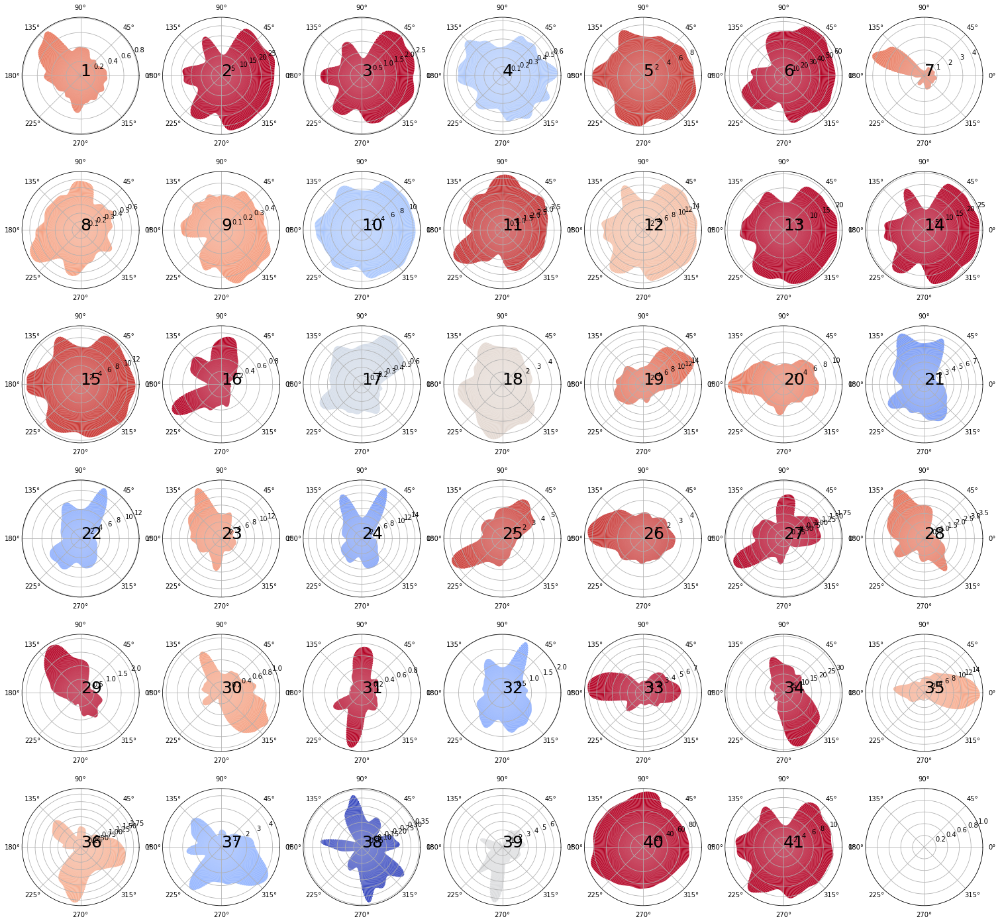

In [46]:
### Visualize the clusters that are significant by the cross-validaiton method ###

#Set-up overall colormap
import matplotlib
cmap = matplotlib.cm.get_cmap('coolwarm')


#Set up polar subplots
num_rows = 6
num_cols = 7

pFig, pAx = plt.subplots(num_rows,num_cols, figsize=(26,25), subplot_kw=dict(projection='polar'))


#Set-up for individual polar plots
thetas = np.linspace(0.0,2*np.pi,360,endpoint=False)
widths = ((2.0*np.pi)/360.0)

print(len(pAx)) #TODO remove
print(len(pAx[0])) #TODO remove


#Iterate through all pre-smooth HD fields 
for i, current_HD_field in enumerate(HD_fields_preSmoothed):
    #Compute firing rate
    firing_rate = current_HD_field * 39.06
    
    #Compute the row and column indeces to plot this one on
    row_idx = i // num_cols
    col_idx = i % num_cols
    
    
    #Set up the color
    cur_cm_norm = matplotlib.colors.Normalize(vmin=min(zScores_better_arr), vmax=zScores_cutOff_arr[i])
    cur_colour = cmap(current_norm(zScores_better_arr[i]))
    
        
    #Plot axis and label
    pAx[row_idx,col_idx].bar(thetas, firing_rate, width=widths, color=cur_colour )
    pAx[row_idx,col_idx].text(np.radians(180), 0, (i+1), fontsize=25)
        
plt.show()